In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.utils.prune as prune
import torchvision.models as models
from torch.onnx import export

import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

from torch.nn.utils import parameters_to_vector
from torch.optim.lr_scheduler import ReduceLROnPlateau

from torch.optim.lr_scheduler import CosineAnnealingLR

In [3]:
# 乱数を一定にする
seed = 777  # 好きな数字でOK
torch.manual_seed(seed)
np.random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [4]:
# onnxファイルを作成する関数
def model_to_onnx(model, output_file, input_shape = (1, 3, 224, 224)):
  model.eval()
  input_tensor = torch.randn(input_shape).to('cpu')
  input_names = ['input']
  output_names = ['output']
  torch.onnx.export(model, input_tensor, output_file, verbose = False, input_names = input_names, output_names = output_names)
  return output_file

In [5]:
# モデル読み込み
pt_model_path = "../dense.pt"
model = models.resnet18()
model.fc = nn.Linear(model.fc.in_features, 10)  # CIFAR-10 にあわせて出力層変更
model.load_state_dict(torch.load(pt_model_path))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [6]:
# 訓練データセット作成
transform = transforms.Compose([transforms.Resize(224),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])   # 正規化したほうがいいらしい

trainset = torchvision.datasets.CIFAR10(root = "./data", train = True, download = True, transform = transform)
trainloader = DataLoader(trainset, batch_size = 400, shuffle = True)

In [7]:
def project_l1_ball(tensor_x: np.ndarray, radius: float) -> np.ndarray:
    """
    テンソル `tensor_x` を、中心が原点のL1ノルム半径 `radius` の超球（L1ボール）の表面または内部に射影する。
    これは、制約条件 ||z||_1 <= radius を満たす、最も `tensor_x` に近い点 `z` を見つける操作。
    アルゴリズムは、"Projection onto the L1-ball" として知られる効率的な手法に基づいている。
    """
    # ステップ 1: 入力テンソルのL1ノルムを計算し、そもそも射影が必要かを確認
    # もしL1ノルムが既に半径以下なら、テンソルは制約を満たしており、何もしなくてよい。
    if np.sum(np.abs(tensor_x)) <= radius:
        return tensor_x

    # ステップ 3: 符号情報を無視し、絶対値のテンソルを作成
    # 射影アルゴリズムは、正の象限（すべての要素が非負）で動作し、最後に元の符号を復元する。
    u_tensor = np.abs(tensor_x)

    # ステップ 4: 絶対値テンソル `u_tensor` を降順にソートする。
    # このソートが、効率的なアルゴリズムの鍵となる。
    u_sorted = np.sort(u_tensor, axis=None)[::-1]
    n_features = len(u_sorted)

    # ステップ 5: ソートされたベクトルの累積和を計算する。
    # sv[i-1] は、u の中で最も大きい i 個の要素の和を表す。
    sv = np.cumsum(u_sorted)

    # ステップ 6: 射影の閾値 `theta` を見つけるための条件を満たす `rho` を探す。
    # ここがアルゴリズムの核心部分。
    # 数学的な導出により、射影後のベクトルは `y = sign(v) * max(abs(v) - theta, 0)` という形になることが分かっている。
    # この `y` のL1ノルムが `radius` に等しくなるような `theta` を見つけたい。
    # そのための条件が `u_sorted[i-1] > (sv[i-1] - radius) / i` であり、
    # この条件を満たす最大のインデックスが `rho` となる。
    
    # i = 1, 2, ..., n_features を生成
    arange_i = np.arange(1, n_features + 1)
    
    # 条件を満たすインデックスの候補を探す
    rho_candidates = np.where(u_sorted > (sv - radius) / arange_i)[0]
    
    # 候補の中から最大のインデックスをrhoとして採用する（0-basedから1-basedに変換するため+1）
    # 候補がない場合は、すべての要素が同じだけシフトされるケース
    rho = rho_candidates[-1] + 1 if len(rho_candidates) > 0 else n_features

    # ステップ 7: 決定した `rho` を使って、最終的なシフト量 `theta` を計算する。
    # thetaは、各要素から（絶対値の形で）引き算される値。
    theta = (sv[rho - 1] - radius) / rho

    # ステップ 8: ソフトしきい値処理（soft-thresholding）を実行して、射影を完了させる。
    # 1. 各要素の絶対値から `theta` を引く。
    # 2. 結果が負になった場合は0にする（`np.maximum(..., 0)`）。
    # 3. 元の符号 `sign(v)` を掛け合わせて、正しい象限に戻す。
    projected_tensor_x = np.sign(tensor_x) * np.maximum(np.abs(tensor_x) - theta, 0)

    # ステップ 9: 返す。
    return projected_tensor_x

def hard_threshold(tensor_x: np.ndarray, K0: int) -> np.ndarray:
    """
    テンソル `tensor_x` に対してハードしきい値処理を適用する。
    これは、制約条件 ||z||_0 <= K0 を満たす、最も `tensor_x` に近い点 `z` を見つける操作。
    簡単に言うと、テンソルの要素のうち、絶対値が大きい方から `K0` 個だけを残し、
    それ以外をすべて厳密に0にする。
    """
    # ステップ 1: そもそも処理が必要かを確認
    # もし残したい非ゼロ要素の数 `K0` が、テンソルの全要素数以上なら、
    # どの要素も0にする必要はないので、そのまま返す。
    if K0 >= tensor_x.size:
        return tensor_x
    
    # ステップ 3: 0にすべき要素を決定するための「しきい値」を見つける。
    # しきい値は、ベクトル `v` の絶対値を小さい順にソートしたとき、
    # 後ろから `K0` 番目（つまり、絶対値が `K0` 番目に大きい要素）の値となる。
    # 例: v=[10, -2, 5, -8], K0=2 の場合、abs(v)=[10, 2, 5, 8]。
    #    ソートすると [2, 5, 8, 10]。後ろから2番目は `8`。これがしきい値となる。
    # 同じ値の要素があった場合は非ゼロの要素がK0
    threshold = np.sort(np.abs(tensor_x), axis=None)[-(K0+1)]

    # ステップ 4: しきい値に基づいて、値を0にする。
    # 絶対値がこのしきい値より「小さい」すべての要素を0で上書きする。
    # 例: abs(v) < 8 となるのは `2` と `5`。対応する元の要素 `-2` と `5` が0になる。
    tensor_x[np.abs(tensor_x) <= threshold] = 0

    return tensor_x



In [8]:
def D_op_4d(tensor: np.ndarray) -> np.ndarray:
    """
    4階数テンソル (out_ch, in_ch, h, w) の4方向の差分を計算し、
    5階数テンソル (out_ch, in_ch, h, w, 4) として返す。
    """
    """
    # dim=0 (出力チャネル方向)
    diff_dim0 = np.roll(tensor, -1, axis=0) - tensor
    # dim=1 (入力チャネル方向)
    diff_dim1 = np.roll(tensor, -1, axis=1) - tensor
    """
    # dim=2 (縦方向)
    diff_dim2 = np.roll(tensor, -1, axis=2) - tensor
    # dim=3 (横方向)
    diff_dim3 = np.roll(tensor, -1, axis=3) - tensor
    
    # 最後の軸に4つの差分をスタックする
    return np.stack([diff_dim2, diff_dim3], axis=-1)

# 転置差分がどんな演算なのかいまいちわかってない
def DT_op_4d(stacked_tensor: np.ndarray) -> np.ndarray:
    """
    D_op_4dの転置演算。5階数テンソルを受け取り、4階数テンソルを返す。
    """
    # 各差分を取り出す
    d0 = stacked_tensor[..., 0]
    d1 = stacked_tensor[..., 1]

    # 各々の転置差分を計算し、合計する (D^T = -D_backward)
    term0 = np.roll(d0, 1, axis=0) - d0
    term1 = np.roll(d1, 1, axis=1) - d1
    
    return term0 + term1

In [9]:
from scipy.sparse.linalg import cg, LinearOperator # LinearOperatorをインポート

def solve_admm(
    w: np.ndarray, 
    D_op, 
    DT_op, 
    K1: float, 
    K0_ratio: float, 
    rho: float, 
    gamma: float,
    n_iter: int,
):
    # --- 初期化 ---
    # 全ての変数を float64 で厳密に初期化
    x  = w.copy().astype(np.float64)
    y = D_op(x).astype(np.float64)
    z = x.copy().astype(np.float64)
    u1 = np.zeros_like(y, dtype=np.float64)
    u2 = np.zeros_like(z, dtype=np.float64)
    K0 = int(K0_ratio * w.size)
    
    # テンソルの総要素数を計算 (LinearOperatorのshape定義のため)
    n_elements = w.size

    print(f"Tensor shape: {w.shape}, K1={K1}, K0={K0} ({K0_ratio*100:.1f}%)")

    # ★★★ ここからが大幅な変更点 ★★★

    # 1. matvec関数を定義 (入力と出力が1次元ベクトルであることを明示)
    def matvec_for_lo(p_flat: np.ndarray) -> np.ndarray:
        # 内部で型変換は行わず、入力の型を信頼する
        p = p_flat.reshape(w.shape)
        DTD_p = DT_op(D_op(p))
        result = rho * DTD_p + gamma * p + p
        return result.flatten()

    # 2. LinearOperatorを明示的に作成
    # これにより、shapeとdtypeをcg関数に正確に伝える
    A = LinearOperator(
        shape=(n_elements, n_elements), # 作用素は (N, N) の正方行列として振る舞う
        matvec=matvec_for_lo,
        dtype=np.float64               # 扱うデータ型は float64 であることを明記
    )

    # ★★★ 変更ここまで ★★★


    # --- ADMM反復ループ ---
    for i in range(n_iter):
        # 1. x の更新
        # v は float64 であることを確認済み
        v = w + rho * DT_op(y - u1) + gamma * (z - u2)
        
        # LinearOperatorオブジェクト A を直接cgに渡す
        x_flat, _ = cg(A, v.flatten(), x0=x.flatten())
        x = x_flat.reshape(w.shape)

        # 2. y の更新
        v_proj1 = D_op(x) + u1
        y = project_l1_ball(v_proj1, K1)

        # 3. z の更新
        v_proj2 = x + u2
        z = hard_threshold(v_proj2, K0)

        # 4. 双対変数 u1, u2 の更新
        u1 = u1 + D_op(x) - y
        u2 = u2 + x - z
        
        if i % 5 == 0:
            recon_error = np.linalg.norm(x - w) / np.linalg.norm(w)
            print(f"Iteration {i+1}/{n_iter}, Reconstruction Error: {recon_error:.4f}")

    return x

In [10]:
def Omega(delta):
    """
    4階テンソルdeltaの各次元に沿った差分を計算し、
    その絶対値の総和を返す。
    """
    h = 1.0  # Dのパラメータ

    # 4つの次元それぞれに対して差分（勾配）を計算

    # dim=0 (出力チャネル方向の差分)
    diff_dim0 = delta[1:, :, :, :] - delta[:-1, :, :, :]

    # dim=1 (入力チャネル方向の差分)
    diff_dim1 = delta[:, 1:, :, :] - delta[:, :-1, :, :]

    # dim=2 (縦方向の差分)
    # 1行目から最後までと、0行目から最後の一つ手前までの差
    diff_dim2 = delta[:, :, 1:, :] - delta[:, :, :-1, :]

    # dim=3 (横方向の差分)
    # 1列目から最後までと、0列目から最後の一つ手前までの差
    diff_dim3 = delta[:, :, :, 1:] - delta[:, :, :, :-1]

    # 全ての差分の絶対値の総和を計算
    # これがD@deltaに相当する操作のL1ノルムになる
    constrain = torch.sum(torch.abs(diff_dim0)) + torch.sum(torch.abs(diff_dim1)) + torch.sum(torch.abs(diff_dim2)) + torch.sum(torch.abs(diff_dim3))

    return constrain / h

In [11]:
# 各層のTVを見てみる
layer_tvs = {}
layer_relative_tvs = {}
conv_layer_names = []

for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d):
        w_tensor = module.weight.detach().clone().to(device)
        tv = Omega(w_tensor).item()
        ave_tv = tv/(w_tensor).numel()
        relative_tv = tv / torch.sum(torch.abs(w_tensor)).item()
        layer_tvs[name] = tv
        layer_relative_tvs[name] = relative_tv
        conv_layer_names.append(name)
        print(f"{name}：TV={tv:.4f}     ave_TV={ave_tv:.4f}     relative_TV={relative_tv:.4f}")

conv1：TV=2785.1948     ave_TV=0.2960     relative_TV=3.8864
layer1.0.conv1：TV=5368.6899     ave_TV=0.1456     relative_TV=4.6001
layer1.0.conv2：TV=5110.8359     ave_TV=0.1386     relative_TV=4.3279
layer1.1.conv1：TV=5665.4883     ave_TV=0.1537     relative_TV=4.4829
layer1.1.conv2：TV=5081.4331     ave_TV=0.1378     relative_TV=4.3692
layer2.0.conv1：TV=9606.8564     ave_TV=0.1303     relative_TV=4.4254
layer2.0.conv2：TV=15700.7480     ave_TV=0.1065     relative_TV=4.4383
layer2.0.downsample.0：TV=1077.2024     ave_TV=0.1315     relative_TV=2.9591
layer2.1.conv1：TV=16048.6338     ave_TV=0.1088     relative_TV=4.4778
layer2.1.conv2：TV=14007.5215     ave_TV=0.0950     relative_TV=4.2592
layer3.0.conv1：TV=24442.1191     ave_TV=0.0829     relative_TV=3.9467
layer3.0.conv2：TV=45506.3359     ave_TV=0.0772     relative_TV=4.1868
layer3.0.downsample.0：TV=2261.6729     ave_TV=0.0690     relative_TV=2.8949
layer3.1.conv1：TV=41485.1523     ave_TV=0.0703     relative_TV=4.2055
layer3.1.conv2：TV=37498

In [12]:
import json

# JSONファイルから辞書を読み込む
with open('../その他/99cut_data.json', 'r') as f:
    zero_ratings = json.load(f)

with open('../その他/99cut_TV.json', 'r') as f:
    target_TVs = json.load(f)


In [13]:
#final_weights_to_assign = {}
masks = {}

for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d):
        print(f"\n--- レイヤー '{name}' の処理を開始 ---")

        # wを4階テンソルのまま取得
        # .detach().clone()で勾配情報を切り離し、安全なコピーを作成し、numpyに変換、scipyのcg法に合うようにfloat64に
        w_numpy = module.weight.detach().clone().to('cpu').numpy().astype(np.float64)

        # --- パラメータ設定と実行 ---
        K1_val = target_TVs[name]*0.5  #0.9     # Total Variationの上限
        K0_ratio_val = 1 - zero_ratings[name]   # 10%を非ゼロにする (目標のスパース率90%)
        rho_val = 0.01        # block性ペナルティパラメータ
        gamma_val = 15.0   # sparse性ペナルティパラメータ
        iterations = 300 #300   # 繰り返し回数

        # ADMMソルバーを実行
        x_final = solve_admm(
            w=w_numpy,
            D_op=D_op_4d,        
            DT_op=DT_op_4d,      
            K1=K1_val,
            K0_ratio=K0_ratio_val,
            rho=rho_val,
            gamma=gamma_val,
            n_iter=iterations
        )
        with torch.no_grad():
            # 閾値で0に近い値を完全な0にする
            x_final[np.abs(x_final) <= 1e-4] = 0
            # モデルを上書き
            module.weight.copy_(torch.tensor(x_final))

        # 結果の簡単な確認
        print("\n結果:")
        #print(x_final)
        print(f"元の重みテンソルの非ゼロの要素数: {np.sum(w_numpy != 0)}")
        print(f"ADMM後の重みテンソルの非ゼロの要素数: {np.sum(x_final != 0)} (目標数{int(K0_ratio_val * w_numpy.size)})")
        print(f"||Dx||_1: {np.sum(np.abs(D_op_4d(x_final))):.4f} (制約は{K1_val}以下)")



--- レイヤー 'conv1' の処理を開始 ---
Tensor shape: (64, 3, 7, 7), K1=1246.541015625, K0=3307 (35.2%)
Iteration 1/300, Reconstruction Error: 0.0000
Iteration 6/300, Reconstruction Error: 0.1763
Iteration 11/300, Reconstruction Error: 0.1763
Iteration 16/300, Reconstruction Error: 0.1763
Iteration 21/300, Reconstruction Error: 0.1764
Iteration 26/300, Reconstruction Error: 0.1764
Iteration 31/300, Reconstruction Error: 0.1764
Iteration 36/300, Reconstruction Error: 0.1765
Iteration 41/300, Reconstruction Error: 0.1765
Iteration 46/300, Reconstruction Error: 0.1766
Iteration 51/300, Reconstruction Error: 0.1767
Iteration 56/300, Reconstruction Error: 0.1767
Iteration 61/300, Reconstruction Error: 0.1768
Iteration 66/300, Reconstruction Error: 0.1769
Iteration 71/300, Reconstruction Error: 0.1770
Iteration 76/300, Reconstruction Error: 0.1771


Iteration 81/300, Reconstruction Error: 0.1772
Iteration 86/300, Reconstruction Error: 0.1773
Iteration 91/300, Reconstruction Error: 0.1774
Iteration 96/300, Reconstruction Error: 0.1775
Iteration 101/300, Reconstruction Error: 0.1776
Iteration 106/300, Reconstruction Error: 0.1777
Iteration 111/300, Reconstruction Error: 0.1778
Iteration 116/300, Reconstruction Error: 0.1779
Iteration 121/300, Reconstruction Error: 0.1780
Iteration 126/300, Reconstruction Error: 0.1780
Iteration 131/300, Reconstruction Error: 0.1781
Iteration 136/300, Reconstruction Error: 0.1782


Iteration 141/300, Reconstruction Error: 0.1783
Iteration 146/300, Reconstruction Error: 0.1784
Iteration 151/300, Reconstruction Error: 0.1785
Iteration 156/300, Reconstruction Error: 0.1786
Iteration 161/300, Reconstruction Error: 0.1786
Iteration 166/300, Reconstruction Error: 0.1787
Iteration 171/300, Reconstruction Error: 0.1788
Iteration 176/300, Reconstruction Error: 0.1789
Iteration 181/300, Reconstruction Error: 0.1789
Iteration 186/300, Reconstruction Error: 0.1790
Iteration 191/300, Reconstruction Error: 0.1791
Iteration 196/300, Reconstruction Error: 0.1791
Iteration 201/300, Reconstruction Error: 0.1792
Iteration 206/300, Reconstruction Error: 0.1792
Iteration 211/300, Reconstruction Error: 0.1793
Iteration 216/300, Reconstruction Error: 0.1794
Iteration 221/300, Reconstruction Error: 0.1794


Iteration 226/300, Reconstruction Error: 0.1795
Iteration 231/300, Reconstruction Error: 0.1795
Iteration 236/300, Reconstruction Error: 0.1796
Iteration 241/300, Reconstruction Error: 0.1796
Iteration 246/300, Reconstruction Error: 0.1797
Iteration 251/300, Reconstruction Error: 0.1797
Iteration 256/300, Reconstruction Error: 0.1797
Iteration 261/300, Reconstruction Error: 0.1798
Iteration 266/300, Reconstruction Error: 0.1798
Iteration 271/300, Reconstruction Error: 0.1799
Iteration 276/300, Reconstruction Error: 0.1799
Iteration 281/300, Reconstruction Error: 0.1799
Iteration 286/300, Reconstruction Error: 0.1800
Iteration 291/300, Reconstruction Error: 0.1800


Iteration 296/300, Reconstruction Error: 0.1800

結果:
元の重みテンソルの非ゼロの要素数: 9408
ADMM後の重みテンソルの非ゼロの要素数: 3307 (目標数3307)
||Dx||_1: 1250.0432 (制約は1246.541015625以下)

--- レイヤー 'layer1.0.conv1' の処理を開始 ---
Tensor shape: (64, 64, 3, 3), K1=1529.1573486328125, K0=4537 (12.3%)
Iteration 1/300, Reconstruction Error: 0.0000
Iteration 6/300, Reconstruction Error: 0.4595
Iteration 11/300, Reconstruction Error: 0.4595


Iteration 16/300, Reconstruction Error: 0.4595
Iteration 21/300, Reconstruction Error: 0.4595
Iteration 26/300, Reconstruction Error: 0.4596


Iteration 31/300, Reconstruction Error: 0.4596
Iteration 36/300, Reconstruction Error: 0.4597
Iteration 41/300, Reconstruction Error: 0.4597


Iteration 46/300, Reconstruction Error: 0.4598
Iteration 51/300, Reconstruction Error: 0.4598


Iteration 56/300, Reconstruction Error: 0.4599
Iteration 61/300, Reconstruction Error: 0.4600


Iteration 66/300, Reconstruction Error: 0.4600
Iteration 71/300, Reconstruction Error: 0.4601


Iteration 76/300, Reconstruction Error: 0.4602
Iteration 81/300, Reconstruction Error: 0.4602


Iteration 86/300, Reconstruction Error: 0.4603
Iteration 91/300, Reconstruction Error: 0.4603


Iteration 96/300, Reconstruction Error: 0.4604
Iteration 101/300, Reconstruction Error: 0.4604


Iteration 106/300, Reconstruction Error: 0.4604
Iteration 111/300, Reconstruction Error: 0.4605


Iteration 116/300, Reconstruction Error: 0.4605
Iteration 121/300, Reconstruction Error: 0.4605


Iteration 126/300, Reconstruction Error: 0.4606
Iteration 131/300, Reconstruction Error: 0.4606


Iteration 136/300, Reconstruction Error: 0.4606
Iteration 141/300, Reconstruction Error: 0.4606


Iteration 146/300, Reconstruction Error: 0.4606
Iteration 151/300, Reconstruction Error: 0.4607


Iteration 156/300, Reconstruction Error: 0.4607
Iteration 161/300, Reconstruction Error: 0.4607


Iteration 166/300, Reconstruction Error: 0.4607
Iteration 171/300, Reconstruction Error: 0.4607


Iteration 176/300, Reconstruction Error: 0.4607
Iteration 181/300, Reconstruction Error: 0.4607


Iteration 186/300, Reconstruction Error: 0.4607
Iteration 191/300, Reconstruction Error: 0.4607


Iteration 196/300, Reconstruction Error: 0.4607
Iteration 201/300, Reconstruction Error: 0.4607


Iteration 206/300, Reconstruction Error: 0.4607
Iteration 211/300, Reconstruction Error: 0.4607


Iteration 216/300, Reconstruction Error: 0.4607
Iteration 221/300, Reconstruction Error: 0.4607


Iteration 226/300, Reconstruction Error: 0.4608
Iteration 231/300, Reconstruction Error: 0.4608


Iteration 236/300, Reconstruction Error: 0.4608
Iteration 241/300, Reconstruction Error: 0.4608


Iteration 246/300, Reconstruction Error: 0.4608
Iteration 251/300, Reconstruction Error: 0.4608
Iteration 256/300, Reconstruction Error: 0.4608


Iteration 261/300, Reconstruction Error: 0.4608
Iteration 266/300, Reconstruction Error: 0.4608


Iteration 271/300, Reconstruction Error: 0.4608
Iteration 276/300, Reconstruction Error: 0.4608
Iteration 281/300, Reconstruction Error: 0.4608


Iteration 286/300, Reconstruction Error: 0.4608


Iteration 291/300, Reconstruction Error: 0.4608
Iteration 296/300, Reconstruction Error: 0.4608

結果:
元の重みテンソルの非ゼロの要素数: 36864
ADMM後の重みテンソルの非ゼロの要素数: 4537 (目標数4537)
||Dx||_1: 1529.2555 (制約は1529.1573486328125以下)

--- レイヤー 'layer1.0.conv2' の処理を開始 ---
Tensor shape: (64, 64, 3, 3), K1=1236.6435546875, K0=4334 (11.8%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.5904
Iteration 11/300, Reconstruction Error: 0.5904
Iteration 16/300, Reconstruction Error: 0.5904
Iteration 21/300, Reconstruction Error: 0.5904


Iteration 26/300, Reconstruction Error: 0.5904
Iteration 31/300, Reconstruction Error: 0.5905
Iteration 36/300, Reconstruction Error: 0.5905
Iteration 41/300, Reconstruction Error: 0.5905


Iteration 46/300, Reconstruction Error: 0.5905
Iteration 51/300, Reconstruction Error: 0.5906
Iteration 56/300, Reconstruction Error: 0.5906
Iteration 61/300, Reconstruction Error: 0.5906


Iteration 66/300, Reconstruction Error: 0.5907
Iteration 71/300, Reconstruction Error: 0.5907
Iteration 76/300, Reconstruction Error: 0.5907
Iteration 81/300, Reconstruction Error: 0.5907


Iteration 86/300, Reconstruction Error: 0.5908
Iteration 91/300, Reconstruction Error: 0.5908
Iteration 96/300, Reconstruction Error: 0.5908
Iteration 101/300, Reconstruction Error: 0.5908


Iteration 106/300, Reconstruction Error: 0.5908
Iteration 111/300, Reconstruction Error: 0.5909
Iteration 116/300, Reconstruction Error: 0.5909
Iteration 121/300, Reconstruction Error: 0.5909


Iteration 126/300, Reconstruction Error: 0.5909
Iteration 131/300, Reconstruction Error: 0.5909
Iteration 136/300, Reconstruction Error: 0.5909
Iteration 141/300, Reconstruction Error: 0.5909


Iteration 146/300, Reconstruction Error: 0.5909
Iteration 151/300, Reconstruction Error: 0.5909
Iteration 156/300, Reconstruction Error: 0.5909
Iteration 161/300, Reconstruction Error: 0.5909


Iteration 166/300, Reconstruction Error: 0.5909
Iteration 171/300, Reconstruction Error: 0.5909
Iteration 176/300, Reconstruction Error: 0.5909
Iteration 181/300, Reconstruction Error: 0.5909


Iteration 186/300, Reconstruction Error: 0.5909
Iteration 191/300, Reconstruction Error: 0.5909
Iteration 196/300, Reconstruction Error: 0.5909
Iteration 201/300, Reconstruction Error: 0.5909


Iteration 206/300, Reconstruction Error: 0.5910
Iteration 211/300, Reconstruction Error: 0.5910
Iteration 216/300, Reconstruction Error: 0.5910
Iteration 221/300, Reconstruction Error: 0.5910
Iteration 226/300, Reconstruction Error: 0.5910


Iteration 231/300, Reconstruction Error: 0.5910
Iteration 236/300, Reconstruction Error: 0.5910
Iteration 241/300, Reconstruction Error: 0.5910
Iteration 246/300, Reconstruction Error: 0.5910
Iteration 251/300, Reconstruction Error: 0.5910


Iteration 256/300, Reconstruction Error: 0.5910
Iteration 261/300, Reconstruction Error: 0.5910
Iteration 266/300, Reconstruction Error: 0.5910
Iteration 271/300, Reconstruction Error: 0.5910
Iteration 276/300, Reconstruction Error: 0.5910


Iteration 281/300, Reconstruction Error: 0.5910
Iteration 286/300, Reconstruction Error: 0.5910
Iteration 291/300, Reconstruction Error: 0.5910
Iteration 296/300, Reconstruction Error: 0.5910



結果:
元の重みテンソルの非ゼロの要素数: 36864
ADMM後の重みテンソルの非ゼロの要素数: 4334 (目標数4334)
||Dx||_1: 1236.6537 (制約は1236.6435546875以下)

--- レイヤー 'layer1.1.conv1' の処理を開始 ---
Tensor shape: (64, 64, 3, 3), K1=1460.1031494140625, K0=4732 (12.8%)
Iteration 1/300, Reconstruction Error: 0.0000
Iteration 6/300, Reconstruction Error: 0.5310
Iteration 11/300, Reconstruction Error: 0.5310
Iteration 16/300, Reconstruction Error: 0.5310


Iteration 21/300, Reconstruction Error: 0.5311
Iteration 26/300, Reconstruction Error: 0.5312
Iteration 31/300, Reconstruction Error: 0.5313
Iteration 36/300, Reconstruction Error: 0.5314


Iteration 41/300, Reconstruction Error: 0.5315
Iteration 46/300, Reconstruction Error: 0.5317
Iteration 51/300, Reconstruction Error: 0.5318
Iteration 56/300, Reconstruction Error: 0.5320


Iteration 61/300, Reconstruction Error: 0.5321
Iteration 66/300, Reconstruction Error: 0.5323
Iteration 71/300, Reconstruction Error: 0.5324
Iteration 76/300, Reconstruction Error: 0.5325


Iteration 81/300, Reconstruction Error: 0.5327
Iteration 86/300, Reconstruction Error: 0.5328
Iteration 91/300, Reconstruction Error: 0.5329
Iteration 96/300, Reconstruction Error: 0.5330


Iteration 101/300, Reconstruction Error: 0.5331
Iteration 106/300, Reconstruction Error: 0.5332
Iteration 111/300, Reconstruction Error: 0.5332
Iteration 116/300, Reconstruction Error: 0.5333


Iteration 121/300, Reconstruction Error: 0.5334
Iteration 126/300, Reconstruction Error: 0.5334
Iteration 131/300, Reconstruction Error: 0.5335
Iteration 136/300, Reconstruction Error: 0.5335
Iteration 141/300, Reconstruction Error: 0.5335
Iteration 146/300, Reconstruction Error: 0.5336


Iteration 151/300, Reconstruction Error: 0.5336
Iteration 156/300, Reconstruction Error: 0.5336
Iteration 161/300, Reconstruction Error: 0.5337
Iteration 166/300, Reconstruction Error: 0.5337
Iteration 171/300, Reconstruction Error: 0.5337
Iteration 176/300, Reconstruction Error: 0.5337


Iteration 181/300, Reconstruction Error: 0.5337
Iteration 186/300, Reconstruction Error: 0.5337
Iteration 191/300, Reconstruction Error: 0.5337
Iteration 196/300, Reconstruction Error: 0.5338


Iteration 201/300, Reconstruction Error: 0.5338
Iteration 206/300, Reconstruction Error: 0.5338
Iteration 211/300, Reconstruction Error: 0.5338
Iteration 216/300, Reconstruction Error: 0.5338
Iteration 221/300, Reconstruction Error: 0.5338


Iteration 226/300, Reconstruction Error: 0.5338
Iteration 231/300, Reconstruction Error: 0.5338
Iteration 236/300, Reconstruction Error: 0.5338
Iteration 241/300, Reconstruction Error: 0.5338


Iteration 246/300, Reconstruction Error: 0.5338
Iteration 251/300, Reconstruction Error: 0.5338
Iteration 256/300, Reconstruction Error: 0.5338
Iteration 261/300, Reconstruction Error: 0.5338


Iteration 266/300, Reconstruction Error: 0.5338
Iteration 271/300, Reconstruction Error: 0.5338
Iteration 276/300, Reconstruction Error: 0.5338
Iteration 281/300, Reconstruction Error: 0.5338


Iteration 286/300, Reconstruction Error: 0.5338
Iteration 291/300, Reconstruction Error: 0.5338
Iteration 296/300, Reconstruction Error: 0.5338

結果:
元の重みテンソルの非ゼロの要素数: 36864
ADMM後の重みテンソルの非ゼロの要素数: 4732 (目標数4732)
||Dx||_1: 1460.1397 (制約は1460.1031494140625以下)

--- レイヤー 'layer1.1.conv2' の処理を開始 ---
Tensor shape: (64, 64, 3, 3), K1=1156.766845703125, K0=4113 (11.2%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.6112
Iteration 11/300, Reconstruction Error: 0.6112
Iteration 16/300, Reconstruction Error: 0.6112
Iteration 21/300, Reconstruction Error: 0.6113


Iteration 26/300, Reconstruction Error: 0.6113
Iteration 31/300, Reconstruction Error: 0.6114
Iteration 36/300, Reconstruction Error: 0.6115
Iteration 41/300, Reconstruction Error: 0.6115
Iteration 46/300, Reconstruction Error: 0.6116


Iteration 51/300, Reconstruction Error: 0.6117
Iteration 56/300, Reconstruction Error: 0.6118
Iteration 61/300, Reconstruction Error: 0.6119


Iteration 66/300, Reconstruction Error: 0.6120
Iteration 71/300, Reconstruction Error: 0.6120
Iteration 76/300, Reconstruction Error: 0.6121


Iteration 81/300, Reconstruction Error: 0.6122
Iteration 86/300, Reconstruction Error: 0.6123
Iteration 91/300, Reconstruction Error: 0.6123
Iteration 96/300, Reconstruction Error: 0.6124


Iteration 101/300, Reconstruction Error: 0.6124
Iteration 106/300, Reconstruction Error: 0.6125
Iteration 111/300, Reconstruction Error: 0.6125
Iteration 116/300, Reconstruction Error: 0.6125


Iteration 121/300, Reconstruction Error: 0.6126
Iteration 126/300, Reconstruction Error: 0.6126
Iteration 131/300, Reconstruction Error: 0.6126
Iteration 136/300, Reconstruction Error: 0.6126


Iteration 141/300, Reconstruction Error: 0.6127
Iteration 146/300, Reconstruction Error: 0.6127
Iteration 151/300, Reconstruction Error: 0.6127
Iteration 156/300, Reconstruction Error: 0.6127


Iteration 161/300, Reconstruction Error: 0.6127
Iteration 166/300, Reconstruction Error: 0.6127
Iteration 171/300, Reconstruction Error: 0.6127
Iteration 176/300, Reconstruction Error: 0.6128
Iteration 181/300, Reconstruction Error: 0.6128
Iteration 186/300, Reconstruction Error: 0.6128
Iteration 191/300, Reconstruction Error: 0.6128


Iteration 196/300, Reconstruction Error: 0.6128
Iteration 201/300, Reconstruction Error: 0.6128
Iteration 206/300, Reconstruction Error: 0.6128
Iteration 211/300, Reconstruction Error: 0.6128
Iteration 216/300, Reconstruction Error: 0.6128
Iteration 221/300, Reconstruction Error: 0.6128


Iteration 226/300, Reconstruction Error: 0.6128
Iteration 231/300, Reconstruction Error: 0.6128
Iteration 236/300, Reconstruction Error: 0.6128
Iteration 241/300, Reconstruction Error: 0.6128
Iteration 246/300, Reconstruction Error: 0.6128


Iteration 251/300, Reconstruction Error: 0.6128
Iteration 256/300, Reconstruction Error: 0.6128
Iteration 261/300, Reconstruction Error: 0.6128
Iteration 266/300, Reconstruction Error: 0.6128
Iteration 271/300, Reconstruction Error: 0.6128
Iteration 276/300, Reconstruction Error: 0.6128


Iteration 281/300, Reconstruction Error: 0.6128
Iteration 286/300, Reconstruction Error: 0.6128
Iteration 291/300, Reconstruction Error: 0.6128
Iteration 296/300, Reconstruction Error: 0.6128

結果:
元の重みテンソルの非ゼロの要素数: 36864
ADMM後の重みテンソルの非ゼロの要素数: 4113 (目標数4113)
||Dx||_1: 1156.7894 (制約は1156.766845703125以下)

--- レイヤー 'layer2.0.conv1' の処理を開始 ---
Tensor shape: (128, 64, 3, 3), K1=2049.390625, K0=7218 (9.8%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.6249
Iteration 11/300, Reconstruction Error: 0.6249


Iteration 16/300, Reconstruction Error: 0.6250
Iteration 21/300, Reconstruction Error: 0.6250
Iteration 26/300, Reconstruction Error: 0.6251


Iteration 31/300, Reconstruction Error: 0.6252
Iteration 36/300, Reconstruction Error: 0.6253
Iteration 41/300, Reconstruction Error: 0.6254


Iteration 46/300, Reconstruction Error: 0.6255
Iteration 51/300, Reconstruction Error: 0.6257
Iteration 56/300, Reconstruction Error: 0.6258


Iteration 61/300, Reconstruction Error: 0.6259
Iteration 66/300, Reconstruction Error: 0.6260
Iteration 71/300, Reconstruction Error: 0.6261


Iteration 76/300, Reconstruction Error: 0.6263
Iteration 81/300, Reconstruction Error: 0.6264


Iteration 86/300, Reconstruction Error: 0.6265
Iteration 91/300, Reconstruction Error: 0.6265
Iteration 96/300, Reconstruction Error: 0.6266


Iteration 101/300, Reconstruction Error: 0.6267
Iteration 106/300, Reconstruction Error: 0.6268
Iteration 111/300, Reconstruction Error: 0.6268
Iteration 116/300, Reconstruction Error: 0.6269


Iteration 121/300, Reconstruction Error: 0.6269
Iteration 126/300, Reconstruction Error: 0.6270
Iteration 131/300, Reconstruction Error: 0.6270


Iteration 136/300, Reconstruction Error: 0.6270
Iteration 141/300, Reconstruction Error: 0.6271
Iteration 146/300, Reconstruction Error: 0.6271


Iteration 151/300, Reconstruction Error: 0.6271
Iteration 156/300, Reconstruction Error: 0.6271
Iteration 161/300, Reconstruction Error: 0.6271


Iteration 166/300, Reconstruction Error: 0.6271
Iteration 171/300, Reconstruction Error: 0.6272
Iteration 176/300, Reconstruction Error: 0.6272


Iteration 181/300, Reconstruction Error: 0.6272
Iteration 186/300, Reconstruction Error: 0.6272


Iteration 191/300, Reconstruction Error: 0.6272
Iteration 196/300, Reconstruction Error: 0.6272


Iteration 201/300, Reconstruction Error: 0.6272
Iteration 206/300, Reconstruction Error: 0.6272
Iteration 211/300, Reconstruction Error: 0.6272


Iteration 216/300, Reconstruction Error: 0.6272
Iteration 221/300, Reconstruction Error: 0.6272


Iteration 226/300, Reconstruction Error: 0.6272
Iteration 231/300, Reconstruction Error: 0.6272


Iteration 236/300, Reconstruction Error: 0.6272
Iteration 241/300, Reconstruction Error: 0.6272


Iteration 246/300, Reconstruction Error: 0.6272
Iteration 251/300, Reconstruction Error: 0.6272


Iteration 256/300, Reconstruction Error: 0.6272
Iteration 261/300, Reconstruction Error: 0.6272


Iteration 266/300, Reconstruction Error: 0.6272
Iteration 271/300, Reconstruction Error: 0.6272


Iteration 276/300, Reconstruction Error: 0.6272
Iteration 281/300, Reconstruction Error: 0.6272


Iteration 286/300, Reconstruction Error: 0.6272
Iteration 291/300, Reconstruction Error: 0.6272


Iteration 296/300, Reconstruction Error: 0.6272

結果:
元の重みテンソルの非ゼロの要素数: 73728
ADMM後の重みテンソルの非ゼロの要素数: 7218 (目標数7218)
||Dx||_1: 2049.4177 (制約は2049.390625以下)

--- レイヤー 'layer2.0.conv2' の処理を開始 ---
Tensor shape: (128, 128, 3, 3), K1=2393.8154296875, K0=8008 (5.4%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.7128


Iteration 11/300, Reconstruction Error: 0.7128


Iteration 16/300, Reconstruction Error: 0.7128


Iteration 21/300, Reconstruction Error: 0.7128


Iteration 26/300, Reconstruction Error: 0.7128


Iteration 31/300, Reconstruction Error: 0.7128


Iteration 36/300, Reconstruction Error: 0.7128


Iteration 41/300, Reconstruction Error: 0.7128


Iteration 46/300, Reconstruction Error: 0.7128


Iteration 51/300, Reconstruction Error: 0.7128


Iteration 56/300, Reconstruction Error: 0.7128


Iteration 61/300, Reconstruction Error: 0.7128


Iteration 66/300, Reconstruction Error: 0.7128


Iteration 71/300, Reconstruction Error: 0.7128


Iteration 76/300, Reconstruction Error: 0.7128


Iteration 81/300, Reconstruction Error: 0.7128


Iteration 86/300, Reconstruction Error: 0.7128


Iteration 91/300, Reconstruction Error: 0.7128


Iteration 96/300, Reconstruction Error: 0.7128


Iteration 101/300, Reconstruction Error: 0.7128


Iteration 106/300, Reconstruction Error: 0.7128


Iteration 111/300, Reconstruction Error: 0.7128


Iteration 116/300, Reconstruction Error: 0.7128


Iteration 121/300, Reconstruction Error: 0.7128


Iteration 126/300, Reconstruction Error: 0.7128


Iteration 131/300, Reconstruction Error: 0.7128


Iteration 136/300, Reconstruction Error: 0.7128


Iteration 141/300, Reconstruction Error: 0.7128


Iteration 146/300, Reconstruction Error: 0.7128


Iteration 151/300, Reconstruction Error: 0.7128


Iteration 156/300, Reconstruction Error: 0.7128
Iteration 161/300, Reconstruction Error: 0.7128


Iteration 166/300, Reconstruction Error: 0.7128
Iteration 171/300, Reconstruction Error: 0.7128


Iteration 176/300, Reconstruction Error: 0.7128
Iteration 181/300, Reconstruction Error: 0.7128


Iteration 186/300, Reconstruction Error: 0.7128


Iteration 191/300, Reconstruction Error: 0.7128
Iteration 196/300, Reconstruction Error: 0.7128


Iteration 201/300, Reconstruction Error: 0.7128
Iteration 206/300, Reconstruction Error: 0.7128


Iteration 211/300, Reconstruction Error: 0.7128


Iteration 216/300, Reconstruction Error: 0.7128
Iteration 221/300, Reconstruction Error: 0.7128


Iteration 226/300, Reconstruction Error: 0.7128


Iteration 231/300, Reconstruction Error: 0.7128
Iteration 236/300, Reconstruction Error: 0.7128


Iteration 241/300, Reconstruction Error: 0.7128
Iteration 246/300, Reconstruction Error: 0.7128


Iteration 251/300, Reconstruction Error: 0.7128
Iteration 256/300, Reconstruction Error: 0.7128


Iteration 261/300, Reconstruction Error: 0.7128
Iteration 266/300, Reconstruction Error: 0.7128


Iteration 271/300, Reconstruction Error: 0.7128


Iteration 276/300, Reconstruction Error: 0.7128
Iteration 281/300, Reconstruction Error: 0.7128


Iteration 286/300, Reconstruction Error: 0.7128
Iteration 291/300, Reconstruction Error: 0.7128


Iteration 296/300, Reconstruction Error: 0.7128



結果:
元の重みテンソルの非ゼロの要素数: 147456
ADMM後の重みテンソルの非ゼロの要素数: 8008 (目標数8008)
||Dx||_1: 2393.5716 (制約は2393.8154296875以下)

--- レイヤー 'layer2.0.downsample.0' の処理を開始 ---
Tensor shape: (128, 64, 1, 1), K1=358.2542724609375, K0=1563 (19.1%)
Iteration 1/300, Reconstruction Error: 0.0000
Iteration 6/300, Reconstruction Error: 0.3864
Iteration 11/300, Reconstruction Error: 0.3864
Iteration 16/300, Reconstruction Error: 0.3864
Iteration 21/300, Reconstruction Error: 0.3864
Iteration 26/300, Reconstruction Error: 0.3864
Iteration 31/300, Reconstruction Error: 0.3864
Iteration 36/300, Reconstruction Error: 0.3864
Iteration 41/300, Reconstruction Error: 0.3864
Iteration 46/300, Reconstruction Error: 0.3864
Iteration 51/300, Reconstruction Error: 0.3864
Iteration 56/300, Reconstruction Error: 0.3864
Iteration 61/300, Reconstruction Error: 0.3864
Iteration 66/300, Reconstruction Error: 0.3864
Iteration 71/300, Reconstruction Error: 0.3864
Iteration 76/300, Reconstruction Error: 0.3864
Iteration 81/300, Reconstr

Iteration 271/300, Reconstruction Error: 0.3864
Iteration 276/300, Reconstruction Error: 0.3864
Iteration 281/300, Reconstruction Error: 0.3864
Iteration 286/300, Reconstruction Error: 0.3864
Iteration 291/300, Reconstruction Error: 0.3864
Iteration 296/300, Reconstruction Error: 0.3864

結果:
元の重みテンソルの非ゼロの要素数: 8192
ADMM後の重みテンソルの非ゼロの要素数: 1563 (目標数1563)
||Dx||_1: 0.0000 (制約は358.2542724609375以下)

--- レイヤー 'layer2.1.conv1' の処理を開始 ---
Tensor shape: (128, 128, 3, 3), K1=2378.83447265625, K0=8177 (5.5%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.7179


Iteration 11/300, Reconstruction Error: 0.7180


Iteration 16/300, Reconstruction Error: 0.7180
Iteration 21/300, Reconstruction Error: 0.7180


Iteration 26/300, Reconstruction Error: 0.7181
Iteration 31/300, Reconstruction Error: 0.7181


Iteration 36/300, Reconstruction Error: 0.7182
Iteration 41/300, Reconstruction Error: 0.7183


Iteration 46/300, Reconstruction Error: 0.7184


Iteration 51/300, Reconstruction Error: 0.7185


Iteration 56/300, Reconstruction Error: 0.7185


Iteration 61/300, Reconstruction Error: 0.7186


Iteration 66/300, Reconstruction Error: 0.7187


Iteration 71/300, Reconstruction Error: 0.7188


Iteration 76/300, Reconstruction Error: 0.7189


Iteration 81/300, Reconstruction Error: 0.7189


Iteration 86/300, Reconstruction Error: 0.7190


Iteration 91/300, Reconstruction Error: 0.7190


Iteration 96/300, Reconstruction Error: 0.7191


Iteration 101/300, Reconstruction Error: 0.7191


Iteration 106/300, Reconstruction Error: 0.7192


Iteration 111/300, Reconstruction Error: 0.7192


Iteration 116/300, Reconstruction Error: 0.7192


Iteration 121/300, Reconstruction Error: 0.7193


Iteration 126/300, Reconstruction Error: 0.7193


Iteration 131/300, Reconstruction Error: 0.7193


Iteration 136/300, Reconstruction Error: 0.7193


Iteration 141/300, Reconstruction Error: 0.7193


Iteration 146/300, Reconstruction Error: 0.7194


Iteration 151/300, Reconstruction Error: 0.7194


Iteration 156/300, Reconstruction Error: 0.7194


Iteration 161/300, Reconstruction Error: 0.7194


Iteration 166/300, Reconstruction Error: 0.7194


Iteration 171/300, Reconstruction Error: 0.7194


Iteration 176/300, Reconstruction Error: 0.7194


Iteration 181/300, Reconstruction Error: 0.7194


Iteration 186/300, Reconstruction Error: 0.7194


Iteration 191/300, Reconstruction Error: 0.7194


Iteration 196/300, Reconstruction Error: 0.7194


Iteration 201/300, Reconstruction Error: 0.7194


Iteration 206/300, Reconstruction Error: 0.7194


Iteration 211/300, Reconstruction Error: 0.7194


Iteration 216/300, Reconstruction Error: 0.7194


Iteration 221/300, Reconstruction Error: 0.7194


Iteration 226/300, Reconstruction Error: 0.7194


Iteration 231/300, Reconstruction Error: 0.7194


Iteration 236/300, Reconstruction Error: 0.7194


Iteration 241/300, Reconstruction Error: 0.7194


Iteration 246/300, Reconstruction Error: 0.7194


Iteration 251/300, Reconstruction Error: 0.7194


Iteration 256/300, Reconstruction Error: 0.7194


Iteration 261/300, Reconstruction Error: 0.7194


Iteration 266/300, Reconstruction Error: 0.7194


Iteration 271/300, Reconstruction Error: 0.7194


Iteration 276/300, Reconstruction Error: 0.7194


Iteration 281/300, Reconstruction Error: 0.7194


Iteration 286/300, Reconstruction Error: 0.7194


Iteration 291/300, Reconstruction Error: 0.7194


Iteration 296/300, Reconstruction Error: 0.7194



結果:
元の重みテンソルの非ゼロの要素数: 147456
ADMM後の重みテンソルの非ゼロの要素数: 8177 (目標数8177)
||Dx||_1: 2378.8104 (制約は2378.83447265625以下)

--- レイヤー 'layer2.1.conv2' の処理を開始 ---
Tensor shape: (128, 128, 3, 3), K1=1510.05810546875, K0=5612 (3.8%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.8066
Iteration 11/300, Reconstruction Error: 0.8066


Iteration 16/300, Reconstruction Error: 0.8066


Iteration 21/300, Reconstruction Error: 0.8067


Iteration 26/300, Reconstruction Error: 0.8067
Iteration 31/300, Reconstruction Error: 0.8067


Iteration 36/300, Reconstruction Error: 0.8067
Iteration 41/300, Reconstruction Error: 0.8067


Iteration 46/300, Reconstruction Error: 0.8067
Iteration 51/300, Reconstruction Error: 0.8068


Iteration 56/300, Reconstruction Error: 0.8068
Iteration 61/300, Reconstruction Error: 0.8068


Iteration 66/300, Reconstruction Error: 0.8068
Iteration 71/300, Reconstruction Error: 0.8068


Iteration 76/300, Reconstruction Error: 0.8068
Iteration 81/300, Reconstruction Error: 0.8068


Iteration 86/300, Reconstruction Error: 0.8068
Iteration 91/300, Reconstruction Error: 0.8069


Iteration 96/300, Reconstruction Error: 0.8069
Iteration 101/300, Reconstruction Error: 0.8069


Iteration 106/300, Reconstruction Error: 0.8069
Iteration 111/300, Reconstruction Error: 0.8069


Iteration 116/300, Reconstruction Error: 0.8069
Iteration 121/300, Reconstruction Error: 0.8069


Iteration 126/300, Reconstruction Error: 0.8069
Iteration 131/300, Reconstruction Error: 0.8069


Iteration 136/300, Reconstruction Error: 0.8069
Iteration 141/300, Reconstruction Error: 0.8069


Iteration 146/300, Reconstruction Error: 0.8069
Iteration 151/300, Reconstruction Error: 0.8069


Iteration 156/300, Reconstruction Error: 0.8069
Iteration 161/300, Reconstruction Error: 0.8069


Iteration 166/300, Reconstruction Error: 0.8069
Iteration 171/300, Reconstruction Error: 0.8069


Iteration 176/300, Reconstruction Error: 0.8069
Iteration 181/300, Reconstruction Error: 0.8069


Iteration 186/300, Reconstruction Error: 0.8069
Iteration 191/300, Reconstruction Error: 0.8069


Iteration 196/300, Reconstruction Error: 0.8069
Iteration 201/300, Reconstruction Error: 0.8069


Iteration 206/300, Reconstruction Error: 0.8069
Iteration 211/300, Reconstruction Error: 0.8069
Iteration 216/300, Reconstruction Error: 0.8069


Iteration 221/300, Reconstruction Error: 0.8069
Iteration 226/300, Reconstruction Error: 0.8069
Iteration 231/300, Reconstruction Error: 0.8069


Iteration 236/300, Reconstruction Error: 0.8069
Iteration 241/300, Reconstruction Error: 0.8069
Iteration 246/300, Reconstruction Error: 0.8069


Iteration 251/300, Reconstruction Error: 0.8069
Iteration 256/300, Reconstruction Error: 0.8069
Iteration 261/300, Reconstruction Error: 0.8069


Iteration 266/300, Reconstruction Error: 0.8069
Iteration 271/300, Reconstruction Error: 0.8069
Iteration 276/300, Reconstruction Error: 0.8069


Iteration 281/300, Reconstruction Error: 0.8069
Iteration 286/300, Reconstruction Error: 0.8069
Iteration 291/300, Reconstruction Error: 0.8069


Iteration 296/300, Reconstruction Error: 0.8069

結果:
元の重みテンソルの非ゼロの要素数: 147456
ADMM後の重みテンソルの非ゼロの要素数: 5612 (目標数5612)
||Dx||_1: 1510.0536 (制約は1510.05810546875以下)

--- レイヤー 'layer3.0.conv1' の処理を開始 ---
Tensor shape: (256, 128, 3, 3), K1=2464.77880859375, K0=9884 (3.4%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.7937


Iteration 11/300, Reconstruction Error: 0.7937
Iteration 16/300, Reconstruction Error: 0.7937


Iteration 21/300, Reconstruction Error: 0.7937
Iteration 26/300, Reconstruction Error: 0.7937


Iteration 31/300, Reconstruction Error: 0.7937
Iteration 36/300, Reconstruction Error: 0.7937


Iteration 41/300, Reconstruction Error: 0.7937
Iteration 46/300, Reconstruction Error: 0.7937


Iteration 51/300, Reconstruction Error: 0.7937
Iteration 56/300, Reconstruction Error: 0.7937


Iteration 61/300, Reconstruction Error: 0.7937
Iteration 66/300, Reconstruction Error: 0.7937


Iteration 71/300, Reconstruction Error: 0.7937
Iteration 76/300, Reconstruction Error: 0.7937


Iteration 81/300, Reconstruction Error: 0.7937
Iteration 86/300, Reconstruction Error: 0.7937


Iteration 91/300, Reconstruction Error: 0.7937
Iteration 96/300, Reconstruction Error: 0.7937


Iteration 101/300, Reconstruction Error: 0.7937
Iteration 106/300, Reconstruction Error: 0.7937


Iteration 111/300, Reconstruction Error: 0.7937
Iteration 116/300, Reconstruction Error: 0.7937


Iteration 121/300, Reconstruction Error: 0.7937
Iteration 126/300, Reconstruction Error: 0.7937


Iteration 131/300, Reconstruction Error: 0.7937
Iteration 136/300, Reconstruction Error: 0.7937


Iteration 141/300, Reconstruction Error: 0.7937
Iteration 146/300, Reconstruction Error: 0.7937


Iteration 151/300, Reconstruction Error: 0.7937
Iteration 156/300, Reconstruction Error: 0.7937


Iteration 161/300, Reconstruction Error: 0.7937
Iteration 166/300, Reconstruction Error: 0.7937


Iteration 171/300, Reconstruction Error: 0.7937
Iteration 176/300, Reconstruction Error: 0.7937


Iteration 181/300, Reconstruction Error: 0.7937
Iteration 186/300, Reconstruction Error: 0.7937


Iteration 191/300, Reconstruction Error: 0.7937
Iteration 196/300, Reconstruction Error: 0.7937


Iteration 201/300, Reconstruction Error: 0.7937
Iteration 206/300, Reconstruction Error: 0.7937


Iteration 211/300, Reconstruction Error: 0.7937
Iteration 216/300, Reconstruction Error: 0.7937


Iteration 221/300, Reconstruction Error: 0.7937
Iteration 226/300, Reconstruction Error: 0.7937


Iteration 231/300, Reconstruction Error: 0.7937
Iteration 236/300, Reconstruction Error: 0.7937


Iteration 241/300, Reconstruction Error: 0.7937
Iteration 246/300, Reconstruction Error: 0.7937


Iteration 251/300, Reconstruction Error: 0.7937
Iteration 256/300, Reconstruction Error: 0.7937


Iteration 261/300, Reconstruction Error: 0.7937
Iteration 266/300, Reconstruction Error: 0.7937


Iteration 271/300, Reconstruction Error: 0.7937
Iteration 276/300, Reconstruction Error: 0.7937


Iteration 281/300, Reconstruction Error: 0.7937
Iteration 286/300, Reconstruction Error: 0.7937


Iteration 291/300, Reconstruction Error: 0.7937
Iteration 296/300, Reconstruction Error: 0.7937



結果:
元の重みテンソルの非ゼロの要素数: 294912
ADMM後の重みテンソルの非ゼロの要素数: 9884 (目標数9884)
||Dx||_1: 2132.7930 (制約は2464.77880859375以下)

--- レイヤー 'layer3.0.conv2' の処理を開始 ---
Tensor shape: (256, 256, 3, 3), K1=3106.11279296875, K0=11530 (2.0%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.8554


Iteration 11/300, Reconstruction Error: 0.8554


Iteration 16/300, Reconstruction Error: 0.8554


Iteration 21/300, Reconstruction Error: 0.8554


Iteration 26/300, Reconstruction Error: 0.8554


Iteration 31/300, Reconstruction Error: 0.8554


Iteration 36/300, Reconstruction Error: 0.8554


Iteration 41/300, Reconstruction Error: 0.8554


Iteration 46/300, Reconstruction Error: 0.8554


Iteration 51/300, Reconstruction Error: 0.8554


Iteration 56/300, Reconstruction Error: 0.8554


Iteration 61/300, Reconstruction Error: 0.8554


Iteration 66/300, Reconstruction Error: 0.8554


Iteration 71/300, Reconstruction Error: 0.8554


Iteration 76/300, Reconstruction Error: 0.8554


Iteration 81/300, Reconstruction Error: 0.8554


Iteration 86/300, Reconstruction Error: 0.8554


Iteration 91/300, Reconstruction Error: 0.8554


Iteration 96/300, Reconstruction Error: 0.8554


Iteration 101/300, Reconstruction Error: 0.8554


Iteration 106/300, Reconstruction Error: 0.8554


Iteration 111/300, Reconstruction Error: 0.8554


Iteration 116/300, Reconstruction Error: 0.8554


Iteration 121/300, Reconstruction Error: 0.8554


Iteration 126/300, Reconstruction Error: 0.8554


Iteration 131/300, Reconstruction Error: 0.8554


Iteration 136/300, Reconstruction Error: 0.8554


Iteration 141/300, Reconstruction Error: 0.8554


Iteration 146/300, Reconstruction Error: 0.8554


Iteration 151/300, Reconstruction Error: 0.8554


Iteration 156/300, Reconstruction Error: 0.8554


Iteration 161/300, Reconstruction Error: 0.8554


Iteration 166/300, Reconstruction Error: 0.8554


Iteration 171/300, Reconstruction Error: 0.8554


Iteration 176/300, Reconstruction Error: 0.8554


Iteration 181/300, Reconstruction Error: 0.8554


Iteration 186/300, Reconstruction Error: 0.8554


Iteration 191/300, Reconstruction Error: 0.8554


Iteration 196/300, Reconstruction Error: 0.8554


Iteration 201/300, Reconstruction Error: 0.8554


Iteration 206/300, Reconstruction Error: 0.8554


Iteration 211/300, Reconstruction Error: 0.8554


Iteration 216/300, Reconstruction Error: 0.8554


Iteration 221/300, Reconstruction Error: 0.8554


Iteration 226/300, Reconstruction Error: 0.8554


Iteration 231/300, Reconstruction Error: 0.8554


Iteration 236/300, Reconstruction Error: 0.8554


Iteration 241/300, Reconstruction Error: 0.8554


Iteration 246/300, Reconstruction Error: 0.8554


Iteration 251/300, Reconstruction Error: 0.8554


Iteration 256/300, Reconstruction Error: 0.8554


Iteration 261/300, Reconstruction Error: 0.8554


Iteration 266/300, Reconstruction Error: 0.8554


Iteration 271/300, Reconstruction Error: 0.8554


Iteration 276/300, Reconstruction Error: 0.8554


Iteration 281/300, Reconstruction Error: 0.8554


Iteration 286/300, Reconstruction Error: 0.8554


Iteration 291/300, Reconstruction Error: 0.8554


Iteration 296/300, Reconstruction Error: 0.8554



結果:
元の重みテンソルの非ゼロの要素数: 589824
ADMM後の重みテンソルの非ゼロの要素数: 11530 (目標数11530)
||Dx||_1: 3065.0555 (制約は3106.11279296875以下)

--- レイヤー 'layer3.0.downsample.0' の処理を開始 ---
Tensor shape: (256, 128, 1, 1), K1=301.50482177734375, K0=1682 (5.1%)
Iteration 1/300, Reconstruction Error: 0.0000
Iteration 6/300, Reconstruction Error: 0.7463
Iteration 11/300, Reconstruction Error: 0.7463
Iteration 16/300, Reconstruction Error: 0.7463
Iteration 21/300, Reconstruction Error: 0.7463
Iteration 26/300, Reconstruction Error: 0.7463
Iteration 31/300, Reconstruction Error: 0.7463


Iteration 36/300, Reconstruction Error: 0.7463
Iteration 41/300, Reconstruction Error: 0.7463
Iteration 46/300, Reconstruction Error: 0.7463
Iteration 51/300, Reconstruction Error: 0.7463
Iteration 56/300, Reconstruction Error: 0.7463
Iteration 61/300, Reconstruction Error: 0.7463
Iteration 66/300, Reconstruction Error: 0.7463
Iteration 71/300, Reconstruction Error: 0.7463


Iteration 76/300, Reconstruction Error: 0.7463
Iteration 81/300, Reconstruction Error: 0.7463
Iteration 86/300, Reconstruction Error: 0.7463
Iteration 91/300, Reconstruction Error: 0.7463
Iteration 96/300, Reconstruction Error: 0.7463
Iteration 101/300, Reconstruction Error: 0.7463
Iteration 106/300, Reconstruction Error: 0.7463
Iteration 111/300, Reconstruction Error: 0.7463
Iteration 116/300, Reconstruction Error: 0.7463


Iteration 121/300, Reconstruction Error: 0.7463
Iteration 126/300, Reconstruction Error: 0.7463
Iteration 131/300, Reconstruction Error: 0.7463
Iteration 136/300, Reconstruction Error: 0.7463
Iteration 141/300, Reconstruction Error: 0.7463
Iteration 146/300, Reconstruction Error: 0.7463
Iteration 151/300, Reconstruction Error: 0.7463
Iteration 156/300, Reconstruction Error: 0.7463


Iteration 161/300, Reconstruction Error: 0.7463
Iteration 166/300, Reconstruction Error: 0.7463
Iteration 171/300, Reconstruction Error: 0.7463
Iteration 176/300, Reconstruction Error: 0.7463
Iteration 181/300, Reconstruction Error: 0.7463
Iteration 186/300, Reconstruction Error: 0.7463
Iteration 191/300, Reconstruction Error: 0.7463
Iteration 196/300, Reconstruction Error: 0.7463
Iteration 201/300, Reconstruction Error: 0.7463


Iteration 206/300, Reconstruction Error: 0.7463
Iteration 211/300, Reconstruction Error: 0.7463
Iteration 216/300, Reconstruction Error: 0.7463
Iteration 221/300, Reconstruction Error: 0.7463
Iteration 226/300, Reconstruction Error: 0.7463
Iteration 231/300, Reconstruction Error: 0.7463
Iteration 236/300, Reconstruction Error: 0.7463
Iteration 241/300, Reconstruction Error: 0.7463


Iteration 246/300, Reconstruction Error: 0.7463
Iteration 251/300, Reconstruction Error: 0.7463
Iteration 256/300, Reconstruction Error: 0.7463
Iteration 261/300, Reconstruction Error: 0.7463
Iteration 266/300, Reconstruction Error: 0.7463
Iteration 271/300, Reconstruction Error: 0.7463
Iteration 276/300, Reconstruction Error: 0.7463
Iteration 281/300, Reconstruction Error: 0.7463


Iteration 286/300, Reconstruction Error: 0.7463
Iteration 291/300, Reconstruction Error: 0.7463
Iteration 296/300, Reconstruction Error: 0.7463

結果:
元の重みテンソルの非ゼロの要素数: 32768
ADMM後の重みテンソルの非ゼロの要素数: 1682 (目標数1682)
||Dx||_1: 0.0000 (制約は301.50482177734375以下)

--- レイヤー 'layer3.1.conv1' の処理を開始 ---
Tensor shape: (256, 256, 3, 3), K1=1911.2593994140625, K0=7254 (1.2%)


Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.8963


Iteration 11/300, Reconstruction Error: 0.8963


Iteration 16/300, Reconstruction Error: 0.8963


Iteration 21/300, Reconstruction Error: 0.8963


Iteration 26/300, Reconstruction Error: 0.8963


Iteration 31/300, Reconstruction Error: 0.8963


Iteration 36/300, Reconstruction Error: 0.8963


Iteration 41/300, Reconstruction Error: 0.8964


Iteration 46/300, Reconstruction Error: 0.8964


Iteration 51/300, Reconstruction Error: 0.8964


Iteration 56/300, Reconstruction Error: 0.8964


Iteration 61/300, Reconstruction Error: 0.8964


Iteration 66/300, Reconstruction Error: 0.8964


Iteration 71/300, Reconstruction Error: 0.8964


Iteration 76/300, Reconstruction Error: 0.8965


Iteration 81/300, Reconstruction Error: 0.8965


Iteration 86/300, Reconstruction Error: 0.8965


Iteration 91/300, Reconstruction Error: 0.8965


Iteration 96/300, Reconstruction Error: 0.8965


Iteration 101/300, Reconstruction Error: 0.8965


Iteration 106/300, Reconstruction Error: 0.8965


Iteration 111/300, Reconstruction Error: 0.8965


Iteration 116/300, Reconstruction Error: 0.8965


Iteration 121/300, Reconstruction Error: 0.8965


Iteration 126/300, Reconstruction Error: 0.8965


Iteration 131/300, Reconstruction Error: 0.8965


Iteration 136/300, Reconstruction Error: 0.8965


Iteration 141/300, Reconstruction Error: 0.8965


Iteration 146/300, Reconstruction Error: 0.8965


Iteration 151/300, Reconstruction Error: 0.8965


Iteration 156/300, Reconstruction Error: 0.8965


Iteration 161/300, Reconstruction Error: 0.8965


Iteration 166/300, Reconstruction Error: 0.8965


Iteration 171/300, Reconstruction Error: 0.8965


Iteration 176/300, Reconstruction Error: 0.8965


Iteration 181/300, Reconstruction Error: 0.8965


Iteration 186/300, Reconstruction Error: 0.8965


Iteration 191/300, Reconstruction Error: 0.8965


Iteration 196/300, Reconstruction Error: 0.8965


Iteration 201/300, Reconstruction Error: 0.8965


Iteration 206/300, Reconstruction Error: 0.8965


Iteration 211/300, Reconstruction Error: 0.8965


Iteration 216/300, Reconstruction Error: 0.8965


Iteration 221/300, Reconstruction Error: 0.8965


Iteration 226/300, Reconstruction Error: 0.8965


Iteration 231/300, Reconstruction Error: 0.8965


Iteration 236/300, Reconstruction Error: 0.8965


Iteration 241/300, Reconstruction Error: 0.8965


Iteration 246/300, Reconstruction Error: 0.8965


Iteration 251/300, Reconstruction Error: 0.8965


Iteration 256/300, Reconstruction Error: 0.8965


Iteration 261/300, Reconstruction Error: 0.8965


Iteration 266/300, Reconstruction Error: 0.8965


Iteration 271/300, Reconstruction Error: 0.8965


Iteration 276/300, Reconstruction Error: 0.8965


Iteration 281/300, Reconstruction Error: 0.8965


Iteration 286/300, Reconstruction Error: 0.8965


Iteration 291/300, Reconstruction Error: 0.8965


Iteration 296/300, Reconstruction Error: 0.8965



結果:
元の重みテンソルの非ゼロの要素数: 589824
ADMM後の重みテンソルの非ゼロの要素数: 7254 (目標数7254)
||Dx||_1: 1911.2489 (制約は1911.2593994140625以下)

--- レイヤー 'layer3.1.conv2' の処理を開始 ---
Tensor shape: (256, 256, 3, 3), K1=1223.4937744140625, K0=4770 (0.8%)
Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.9261


Iteration 11/300, Reconstruction Error: 0.9261


Iteration 16/300, Reconstruction Error: 0.9261


Iteration 21/300, Reconstruction Error: 0.9261


Iteration 26/300, Reconstruction Error: 0.9261


Iteration 31/300, Reconstruction Error: 0.9261


Iteration 36/300, Reconstruction Error: 0.9261


Iteration 41/300, Reconstruction Error: 0.9261


Iteration 46/300, Reconstruction Error: 0.9261


Iteration 51/300, Reconstruction Error: 0.9261


Iteration 56/300, Reconstruction Error: 0.9261


Iteration 61/300, Reconstruction Error: 0.9261


Iteration 66/300, Reconstruction Error: 0.9262


Iteration 71/300, Reconstruction Error: 0.9262


Iteration 76/300, Reconstruction Error: 0.9262


Iteration 81/300, Reconstruction Error: 0.9262


Iteration 86/300, Reconstruction Error: 0.9262


Iteration 91/300, Reconstruction Error: 0.9262


Iteration 96/300, Reconstruction Error: 0.9262


Iteration 101/300, Reconstruction Error: 0.9262


Iteration 106/300, Reconstruction Error: 0.9262


Iteration 111/300, Reconstruction Error: 0.9262


Iteration 116/300, Reconstruction Error: 0.9262


Iteration 121/300, Reconstruction Error: 0.9262


Iteration 126/300, Reconstruction Error: 0.9262


Iteration 131/300, Reconstruction Error: 0.9262


Iteration 136/300, Reconstruction Error: 0.9262


Iteration 141/300, Reconstruction Error: 0.9262


Iteration 146/300, Reconstruction Error: 0.9262


Iteration 151/300, Reconstruction Error: 0.9262


Iteration 156/300, Reconstruction Error: 0.9262


Iteration 161/300, Reconstruction Error: 0.9262


Iteration 166/300, Reconstruction Error: 0.9262


Iteration 171/300, Reconstruction Error: 0.9262


Iteration 176/300, Reconstruction Error: 0.9262


Iteration 181/300, Reconstruction Error: 0.9262


Iteration 186/300, Reconstruction Error: 0.9262


Iteration 191/300, Reconstruction Error: 0.9262


Iteration 196/300, Reconstruction Error: 0.9262


Iteration 201/300, Reconstruction Error: 0.9262


Iteration 206/300, Reconstruction Error: 0.9262


Iteration 211/300, Reconstruction Error: 0.9262


Iteration 216/300, Reconstruction Error: 0.9262


Iteration 221/300, Reconstruction Error: 0.9262


Iteration 226/300, Reconstruction Error: 0.9262


Iteration 231/300, Reconstruction Error: 0.9262


Iteration 236/300, Reconstruction Error: 0.9262


Iteration 241/300, Reconstruction Error: 0.9262


Iteration 246/300, Reconstruction Error: 0.9262


Iteration 251/300, Reconstruction Error: 0.9262


Iteration 256/300, Reconstruction Error: 0.9262


Iteration 261/300, Reconstruction Error: 0.9262


Iteration 266/300, Reconstruction Error: 0.9262


Iteration 271/300, Reconstruction Error: 0.9262


Iteration 276/300, Reconstruction Error: 0.9262


Iteration 281/300, Reconstruction Error: 0.9262


Iteration 286/300, Reconstruction Error: 0.9262


Iteration 291/300, Reconstruction Error: 0.9262


Iteration 296/300, Reconstruction Error: 0.9262



結果:
元の重みテンソルの非ゼロの要素数: 589824
ADMM後の重みテンソルの非ゼロの要素数: 4770 (目標数4770)
||Dx||_1: 1223.4593 (制約は1223.4937744140625以下)

--- レイヤー 'layer4.0.conv1' の処理を開始 ---
Tensor shape: (512, 256, 3, 3), K1=1574.2340087890625, K0=6648 (0.6%)


Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.9484


Iteration 11/300, Reconstruction Error: 0.9484


Iteration 16/300, Reconstruction Error: 0.9484


Iteration 21/300, Reconstruction Error: 0.9484


Iteration 26/300, Reconstruction Error: 0.9484


Iteration 31/300, Reconstruction Error: 0.9484


Iteration 36/300, Reconstruction Error: 0.9484


Iteration 41/300, Reconstruction Error: 0.9484


Iteration 46/300, Reconstruction Error: 0.9484


Iteration 51/300, Reconstruction Error: 0.9484


Iteration 56/300, Reconstruction Error: 0.9484


Iteration 61/300, Reconstruction Error: 0.9484


Iteration 66/300, Reconstruction Error: 0.9484


Iteration 71/300, Reconstruction Error: 0.9484


Iteration 76/300, Reconstruction Error: 0.9484


Iteration 81/300, Reconstruction Error: 0.9484


Iteration 86/300, Reconstruction Error: 0.9484


Iteration 91/300, Reconstruction Error: 0.9484


Iteration 96/300, Reconstruction Error: 0.9484


Iteration 101/300, Reconstruction Error: 0.9484


Iteration 106/300, Reconstruction Error: 0.9484


Iteration 111/300, Reconstruction Error: 0.9484


Iteration 116/300, Reconstruction Error: 0.9484


Iteration 121/300, Reconstruction Error: 0.9484


Iteration 126/300, Reconstruction Error: 0.9484


Iteration 131/300, Reconstruction Error: 0.9484


Iteration 136/300, Reconstruction Error: 0.9484


Iteration 141/300, Reconstruction Error: 0.9484


Iteration 146/300, Reconstruction Error: 0.9484


Iteration 151/300, Reconstruction Error: 0.9484


Iteration 156/300, Reconstruction Error: 0.9484


Iteration 161/300, Reconstruction Error: 0.9484


Iteration 166/300, Reconstruction Error: 0.9484


Iteration 171/300, Reconstruction Error: 0.9484


Iteration 176/300, Reconstruction Error: 0.9484


Iteration 181/300, Reconstruction Error: 0.9484


Iteration 186/300, Reconstruction Error: 0.9484


Iteration 191/300, Reconstruction Error: 0.9484


Iteration 196/300, Reconstruction Error: 0.9484


Iteration 201/300, Reconstruction Error: 0.9484


Iteration 206/300, Reconstruction Error: 0.9484


Iteration 211/300, Reconstruction Error: 0.9484


Iteration 216/300, Reconstruction Error: 0.9484


Iteration 221/300, Reconstruction Error: 0.9484


Iteration 226/300, Reconstruction Error: 0.9484


Iteration 231/300, Reconstruction Error: 0.9484


Iteration 236/300, Reconstruction Error: 0.9484


Iteration 241/300, Reconstruction Error: 0.9484


Iteration 246/300, Reconstruction Error: 0.9484


Iteration 251/300, Reconstruction Error: 0.9484


Iteration 256/300, Reconstruction Error: 0.9484


Iteration 261/300, Reconstruction Error: 0.9484


Iteration 266/300, Reconstruction Error: 0.9484


Iteration 271/300, Reconstruction Error: 0.9484


Iteration 276/300, Reconstruction Error: 0.9484


Iteration 281/300, Reconstruction Error: 0.9484


Iteration 286/300, Reconstruction Error: 0.9484


Iteration 291/300, Reconstruction Error: 0.9484


Iteration 296/300, Reconstruction Error: 0.9484



結果:
元の重みテンソルの非ゼロの要素数: 1179648
ADMM後の重みテンソルの非ゼロの要素数: 6648 (目標数6648)
||Dx||_1: 1569.7099 (制約は1574.2340087890625以下)

--- レイヤー 'layer4.0.conv2' の処理を開始 ---
Tensor shape: (512, 512, 3, 3), K1=1643.545166015625, K0=5673 (0.2%)


Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.9711


Iteration 11/300, Reconstruction Error: 0.9711


Iteration 16/300, Reconstruction Error: 0.9711


Iteration 21/300, Reconstruction Error: 0.9711


Iteration 26/300, Reconstruction Error: 0.9711


Iteration 31/300, Reconstruction Error: 0.9711


Iteration 36/300, Reconstruction Error: 0.9711


Iteration 41/300, Reconstruction Error: 0.9711


Iteration 46/300, Reconstruction Error: 0.9711


Iteration 51/300, Reconstruction Error: 0.9711


Iteration 56/300, Reconstruction Error: 0.9711


Iteration 61/300, Reconstruction Error: 0.9711


Iteration 66/300, Reconstruction Error: 0.9711


Iteration 71/300, Reconstruction Error: 0.9711


Iteration 76/300, Reconstruction Error: 0.9711


Iteration 81/300, Reconstruction Error: 0.9711


Iteration 86/300, Reconstruction Error: 0.9711


Iteration 91/300, Reconstruction Error: 0.9711


Iteration 96/300, Reconstruction Error: 0.9711


Iteration 101/300, Reconstruction Error: 0.9711


Iteration 106/300, Reconstruction Error: 0.9711


Iteration 111/300, Reconstruction Error: 0.9711


Iteration 116/300, Reconstruction Error: 0.9711


Iteration 121/300, Reconstruction Error: 0.9711


Iteration 126/300, Reconstruction Error: 0.9711


Iteration 131/300, Reconstruction Error: 0.9711


Iteration 136/300, Reconstruction Error: 0.9711


Iteration 141/300, Reconstruction Error: 0.9711


Iteration 146/300, Reconstruction Error: 0.9711


Iteration 151/300, Reconstruction Error: 0.9711


Iteration 156/300, Reconstruction Error: 0.9711


Iteration 161/300, Reconstruction Error: 0.9711


Iteration 166/300, Reconstruction Error: 0.9711


Iteration 171/300, Reconstruction Error: 0.9711


Iteration 176/300, Reconstruction Error: 0.9711


Iteration 181/300, Reconstruction Error: 0.9711


Iteration 186/300, Reconstruction Error: 0.9711


Iteration 191/300, Reconstruction Error: 0.9711


Iteration 196/300, Reconstruction Error: 0.9711


Iteration 201/300, Reconstruction Error: 0.9711


Iteration 206/300, Reconstruction Error: 0.9711


Iteration 211/300, Reconstruction Error: 0.9711


Iteration 216/300, Reconstruction Error: 0.9711


Iteration 221/300, Reconstruction Error: 0.9711


Iteration 226/300, Reconstruction Error: 0.9711


Iteration 231/300, Reconstruction Error: 0.9711


Iteration 236/300, Reconstruction Error: 0.9711


Iteration 241/300, Reconstruction Error: 0.9711


Iteration 246/300, Reconstruction Error: 0.9711


Iteration 251/300, Reconstruction Error: 0.9711


Iteration 256/300, Reconstruction Error: 0.9711


Iteration 261/300, Reconstruction Error: 0.9711


Iteration 266/300, Reconstruction Error: 0.9711


Iteration 271/300, Reconstruction Error: 0.9711


Iteration 276/300, Reconstruction Error: 0.9711


Iteration 281/300, Reconstruction Error: 0.9711


Iteration 286/300, Reconstruction Error: 0.9711


Iteration 291/300, Reconstruction Error: 0.9711


Iteration 296/300, Reconstruction Error: 0.9711



結果:
元の重みテンソルの非ゼロの要素数: 2359296
ADMM後の重みテンソルの非ゼロの要素数: 5673 (目標数5673)
||Dx||_1: 1643.5382 (制約は1643.545166015625以下)

--- レイヤー 'layer4.0.downsample.0' の処理を開始 ---
Tensor shape: (512, 256, 1, 1), K1=1122.681640625, K0=6403 (4.9%)
Iteration 1/300, Reconstruction Error: 0.0000
Iteration 6/300, Reconstruction Error: 0.7625


Iteration 11/300, Reconstruction Error: 0.7625
Iteration 16/300, Reconstruction Error: 0.7625
Iteration 21/300, Reconstruction Error: 0.7625


Iteration 26/300, Reconstruction Error: 0.7625
Iteration 31/300, Reconstruction Error: 0.7625
Iteration 36/300, Reconstruction Error: 0.7625


Iteration 41/300, Reconstruction Error: 0.7625
Iteration 46/300, Reconstruction Error: 0.7625
Iteration 51/300, Reconstruction Error: 0.7625
Iteration 56/300, Reconstruction Error: 0.7625


Iteration 61/300, Reconstruction Error: 0.7625
Iteration 66/300, Reconstruction Error: 0.7625
Iteration 71/300, Reconstruction Error: 0.7625
Iteration 76/300, Reconstruction Error: 0.7625


Iteration 81/300, Reconstruction Error: 0.7625
Iteration 86/300, Reconstruction Error: 0.7625
Iteration 91/300, Reconstruction Error: 0.7625


Iteration 96/300, Reconstruction Error: 0.7625
Iteration 101/300, Reconstruction Error: 0.7625


Iteration 106/300, Reconstruction Error: 0.7625
Iteration 111/300, Reconstruction Error: 0.7625


Iteration 116/300, Reconstruction Error: 0.7625
Iteration 121/300, Reconstruction Error: 0.7625


Iteration 126/300, Reconstruction Error: 0.7625
Iteration 131/300, Reconstruction Error: 0.7625


Iteration 136/300, Reconstruction Error: 0.7625
Iteration 141/300, Reconstruction Error: 0.7625
Iteration 146/300, Reconstruction Error: 0.7625


Iteration 151/300, Reconstruction Error: 0.7625
Iteration 156/300, Reconstruction Error: 0.7625
Iteration 161/300, Reconstruction Error: 0.7625


Iteration 166/300, Reconstruction Error: 0.7625
Iteration 171/300, Reconstruction Error: 0.7625
Iteration 176/300, Reconstruction Error: 0.7625


Iteration 181/300, Reconstruction Error: 0.7625
Iteration 186/300, Reconstruction Error: 0.7625
Iteration 191/300, Reconstruction Error: 0.7625


Iteration 196/300, Reconstruction Error: 0.7625
Iteration 201/300, Reconstruction Error: 0.7625
Iteration 206/300, Reconstruction Error: 0.7625


Iteration 211/300, Reconstruction Error: 0.7625
Iteration 216/300, Reconstruction Error: 0.7625
Iteration 221/300, Reconstruction Error: 0.7625
Iteration 226/300, Reconstruction Error: 0.7625


Iteration 231/300, Reconstruction Error: 0.7625
Iteration 236/300, Reconstruction Error: 0.7625


Iteration 241/300, Reconstruction Error: 0.7625
Iteration 246/300, Reconstruction Error: 0.7625
Iteration 251/300, Reconstruction Error: 0.7625


Iteration 256/300, Reconstruction Error: 0.7625
Iteration 261/300, Reconstruction Error: 0.7625


Iteration 266/300, Reconstruction Error: 0.7625
Iteration 271/300, Reconstruction Error: 0.7625
Iteration 276/300, Reconstruction Error: 0.7625


Iteration 281/300, Reconstruction Error: 0.7625
Iteration 286/300, Reconstruction Error: 0.7625


Iteration 291/300, Reconstruction Error: 0.7625
Iteration 296/300, Reconstruction Error: 0.7625

結果:
元の重みテンソルの非ゼロの要素数: 131072
ADMM後の重みテンソルの非ゼロの要素数: 6403 (目標数6403)
||Dx||_1: 0.0000 (制約は1122.681640625以下)

--- レイヤー 'layer4.1.conv1' の処理を開始 ---


Tensor shape: (512, 512, 3, 3), K1=1096.920166015625, K0=4341 (0.2%)


Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.9813


Iteration 11/300, Reconstruction Error: 0.9813


Iteration 16/300, Reconstruction Error: 0.9813


Iteration 21/300, Reconstruction Error: 0.9813


Iteration 26/300, Reconstruction Error: 0.9813


Iteration 31/300, Reconstruction Error: 0.9813


Iteration 36/300, Reconstruction Error: 0.9813


Iteration 41/300, Reconstruction Error: 0.9813


Iteration 46/300, Reconstruction Error: 0.9813


Iteration 51/300, Reconstruction Error: 0.9813


Iteration 56/300, Reconstruction Error: 0.9813


Iteration 61/300, Reconstruction Error: 0.9813


Iteration 66/300, Reconstruction Error: 0.9813


Iteration 71/300, Reconstruction Error: 0.9813


Iteration 76/300, Reconstruction Error: 0.9813


Iteration 81/300, Reconstruction Error: 0.9813


Iteration 86/300, Reconstruction Error: 0.9813


Iteration 91/300, Reconstruction Error: 0.9813


Iteration 96/300, Reconstruction Error: 0.9813


Iteration 101/300, Reconstruction Error: 0.9813


Iteration 106/300, Reconstruction Error: 0.9813


Iteration 111/300, Reconstruction Error: 0.9813


Iteration 116/300, Reconstruction Error: 0.9813


Iteration 121/300, Reconstruction Error: 0.9813


Iteration 126/300, Reconstruction Error: 0.9813


Iteration 131/300, Reconstruction Error: 0.9813


Iteration 136/300, Reconstruction Error: 0.9813


Iteration 141/300, Reconstruction Error: 0.9813


Iteration 146/300, Reconstruction Error: 0.9813


Iteration 151/300, Reconstruction Error: 0.9813


Iteration 156/300, Reconstruction Error: 0.9813


Iteration 161/300, Reconstruction Error: 0.9813


Iteration 166/300, Reconstruction Error: 0.9813


Iteration 171/300, Reconstruction Error: 0.9813


Iteration 176/300, Reconstruction Error: 0.9813


Iteration 181/300, Reconstruction Error: 0.9813


Iteration 186/300, Reconstruction Error: 0.9813


Iteration 191/300, Reconstruction Error: 0.9813


Iteration 196/300, Reconstruction Error: 0.9813


Iteration 201/300, Reconstruction Error: 0.9813


Iteration 206/300, Reconstruction Error: 0.9813


Iteration 211/300, Reconstruction Error: 0.9813


Iteration 216/300, Reconstruction Error: 0.9813


Iteration 221/300, Reconstruction Error: 0.9813


Iteration 226/300, Reconstruction Error: 0.9813


Iteration 231/300, Reconstruction Error: 0.9813


Iteration 236/300, Reconstruction Error: 0.9813


Iteration 241/300, Reconstruction Error: 0.9813


Iteration 246/300, Reconstruction Error: 0.9813


Iteration 251/300, Reconstruction Error: 0.9813


Iteration 256/300, Reconstruction Error: 0.9813


Iteration 261/300, Reconstruction Error: 0.9813


Iteration 266/300, Reconstruction Error: 0.9813


Iteration 271/300, Reconstruction Error: 0.9813


Iteration 276/300, Reconstruction Error: 0.9813


Iteration 281/300, Reconstruction Error: 0.9813


Iteration 286/300, Reconstruction Error: 0.9813


Iteration 291/300, Reconstruction Error: 0.9813


Iteration 296/300, Reconstruction Error: 0.9813



結果:
元の重みテンソルの非ゼロの要素数: 2359296
ADMM後の重みテンソルの非ゼロの要素数: 4341 (目標数4341)
||Dx||_1: 1048.3872 (制約は1096.920166015625以下)

--- レイヤー 'layer4.1.conv2' の処理を開始 ---
Tensor shape: (512, 512, 3, 3), K1=389.68109130859375, K0=1875 (0.1%)


Iteration 1/300, Reconstruction Error: 0.0000


Iteration 6/300, Reconstruction Error: 0.9825


Iteration 11/300, Reconstruction Error: 0.9824


Iteration 16/300, Reconstruction Error: 0.9824


Iteration 21/300, Reconstruction Error: 0.9824


Iteration 26/300, Reconstruction Error: 0.9824


Iteration 31/300, Reconstruction Error: 0.9824


Iteration 36/300, Reconstruction Error: 0.9824


Iteration 41/300, Reconstruction Error: 0.9824


Iteration 46/300, Reconstruction Error: 0.9824


Iteration 51/300, Reconstruction Error: 0.9824


Iteration 56/300, Reconstruction Error: 0.9824


Iteration 61/300, Reconstruction Error: 0.9824


Iteration 66/300, Reconstruction Error: 0.9824


Iteration 71/300, Reconstruction Error: 0.9824


Iteration 76/300, Reconstruction Error: 0.9824


Iteration 81/300, Reconstruction Error: 0.9824


Iteration 86/300, Reconstruction Error: 0.9824


Iteration 91/300, Reconstruction Error: 0.9824


Iteration 96/300, Reconstruction Error: 0.9824


Iteration 101/300, Reconstruction Error: 0.9824


Iteration 106/300, Reconstruction Error: 0.9824


Iteration 111/300, Reconstruction Error: 0.9824


Iteration 116/300, Reconstruction Error: 0.9824


Iteration 121/300, Reconstruction Error: 0.9824


Iteration 126/300, Reconstruction Error: 0.9824


Iteration 131/300, Reconstruction Error: 0.9824


Iteration 136/300, Reconstruction Error: 0.9824


Iteration 141/300, Reconstruction Error: 0.9824


Iteration 146/300, Reconstruction Error: 0.9824


Iteration 151/300, Reconstruction Error: 0.9824


Iteration 156/300, Reconstruction Error: 0.9824


Iteration 161/300, Reconstruction Error: 0.9824


Iteration 166/300, Reconstruction Error: 0.9824


Iteration 171/300, Reconstruction Error: 0.9824


Iteration 176/300, Reconstruction Error: 0.9824


Iteration 181/300, Reconstruction Error: 0.9824


Iteration 186/300, Reconstruction Error: 0.9824


Iteration 191/300, Reconstruction Error: 0.9824


Iteration 196/300, Reconstruction Error: 0.9824


Iteration 201/300, Reconstruction Error: 0.9824


Iteration 206/300, Reconstruction Error: 0.9824


Iteration 211/300, Reconstruction Error: 0.9824


Iteration 216/300, Reconstruction Error: 0.9824


Iteration 221/300, Reconstruction Error: 0.9824


Iteration 226/300, Reconstruction Error: 0.9824


Iteration 231/300, Reconstruction Error: 0.9824


Iteration 236/300, Reconstruction Error: 0.9824


Iteration 241/300, Reconstruction Error: 0.9824


Iteration 246/300, Reconstruction Error: 0.9824


Iteration 251/300, Reconstruction Error: 0.9824


Iteration 256/300, Reconstruction Error: 0.9824


Iteration 261/300, Reconstruction Error: 0.9824


Iteration 266/300, Reconstruction Error: 0.9824


Iteration 271/300, Reconstruction Error: 0.9824


Iteration 276/300, Reconstruction Error: 0.9824


Iteration 281/300, Reconstruction Error: 0.9824


Iteration 286/300, Reconstruction Error: 0.9824


Iteration 291/300, Reconstruction Error: 0.9824


Iteration 296/300, Reconstruction Error: 0.9824



結果:
元の重みテンソルの非ゼロの要素数: 2359296
ADMM後の重みテンソルの非ゼロの要素数: 1875 (目標数1875)
||Dx||_1: 206.3712 (制約は389.68109130859375以下)


In [14]:
# 非構造時のゼロ比率を表示
all_conv_params = 0
all_conv_zeros = 0

for name, module in model.named_modules():
  if isinstance(module, torch.nn.Conv2d):
    print(f"{name} Zero-Ratio: {100.0 * float(torch.sum(module.weight == 0)) / float(module.weight.nelement()):.4f}%")
    weight_after_pruning = module.weight
    num_zeros = (weight_after_pruning == 0).sum().item()
    total_params = weight_after_pruning.numel()
    all_conv_params += total_params
    all_conv_zeros += num_zeros

sparsity = 100. * all_conv_zeros / all_conv_params if all_conv_params > 0 else 0
print(f"全畳み込み層の0率：{sparsity:.4f}%")

conv1 Zero-Ratio: 64.8491%
layer1.0.conv1 Zero-Ratio: 87.6926%
layer1.0.conv2 Zero-Ratio: 88.2433%
layer1.1.conv1 Zero-Ratio: 87.1636%
layer1.1.conv2 Zero-Ratio: 88.8428%


layer2.0.conv1 Zero-Ratio: 90.2100%
layer2.0.conv2 Zero-Ratio: 94.5692%


layer2.0.downsample.0 Zero-Ratio: 80.9204%
layer2.1.conv1 Zero-Ratio: 94.4546%
layer2.1.conv2 Zero-Ratio: 96.1941%
layer3.0.conv1 Zero-Ratio: 96.6485%
layer3.0.conv2 Zero-Ratio: 98.0452%
layer3.0.downsample.0 Zero-Ratio: 94.8669%


layer3.1.conv1 Zero-Ratio: 98.7701%
layer3.1.conv2 Zero-Ratio: 99.1913%


layer4.0.conv1 Zero-Ratio: 99.4364%
layer4.0.conv2 Zero-Ratio: 99.7595%
layer4.0.downsample.0 Zero-Ratio: 95.1149%
layer4.1.conv1 Zero-Ratio: 99.8160%


layer4.1.conv2 Zero-Ratio: 99.9205%
全畳み込み層の0率：99.0001%


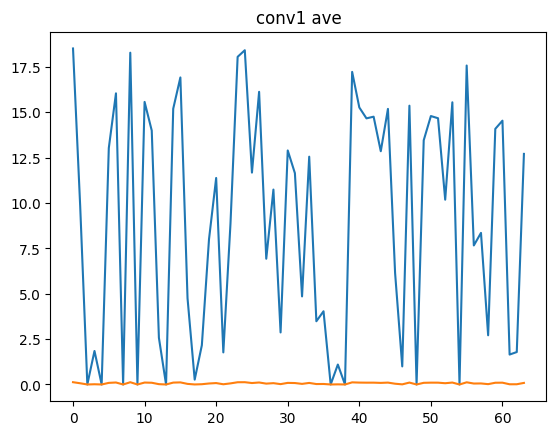

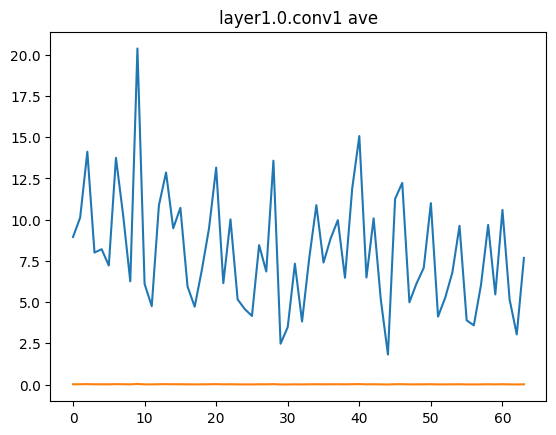

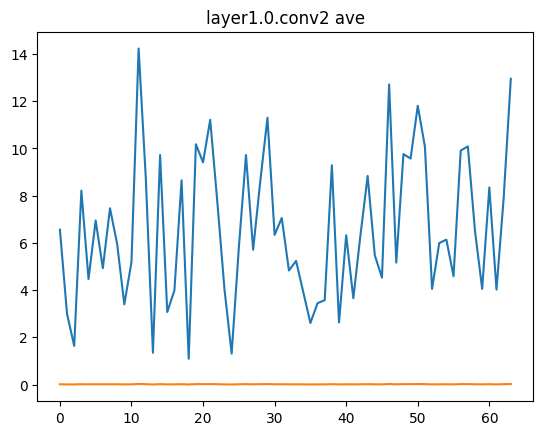

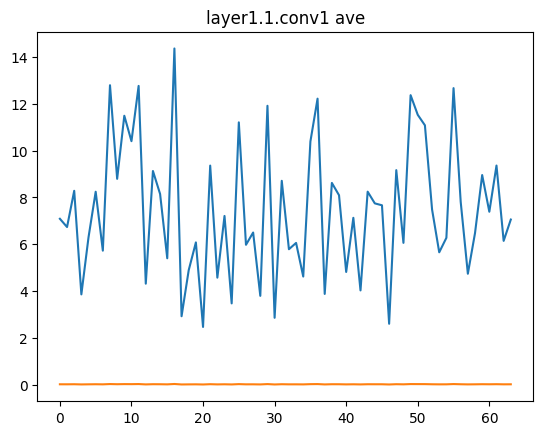

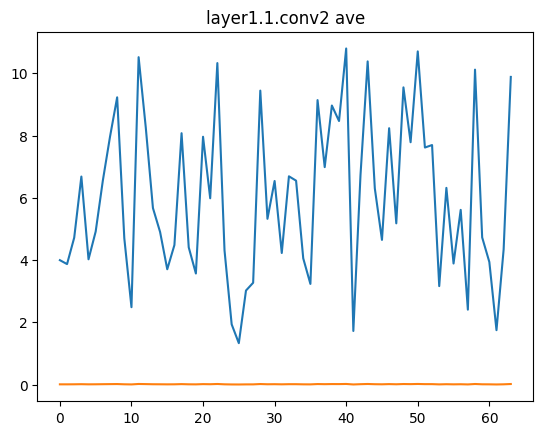

...

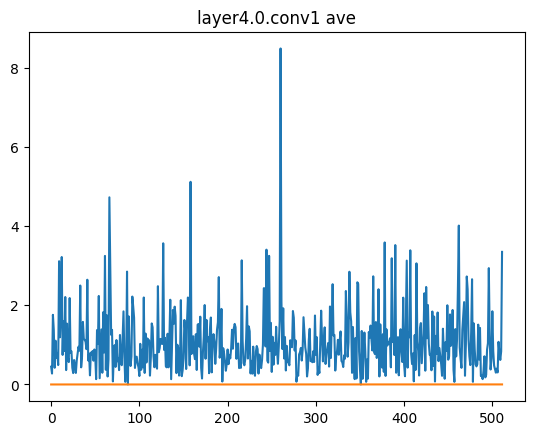

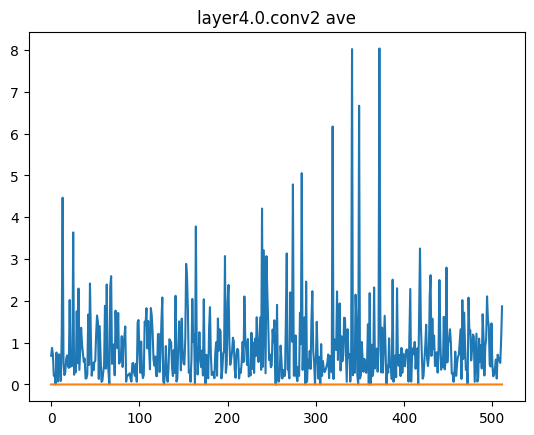

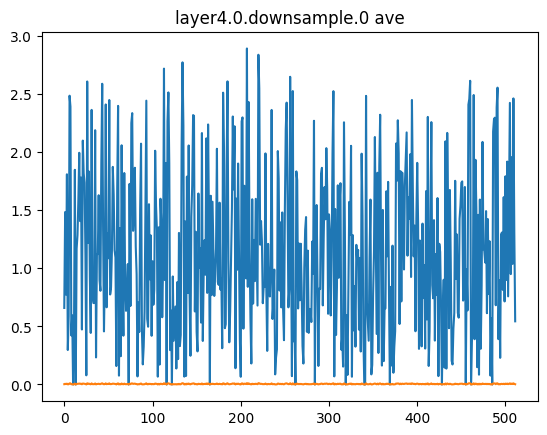

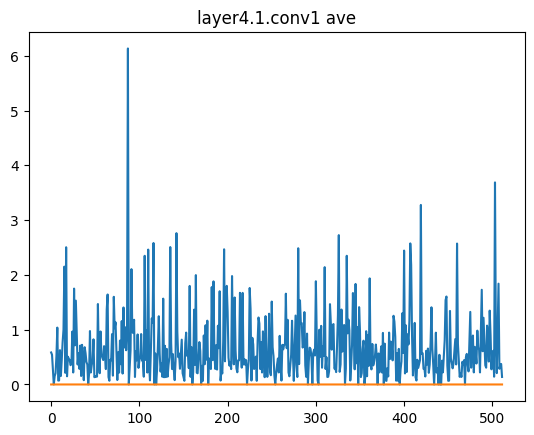

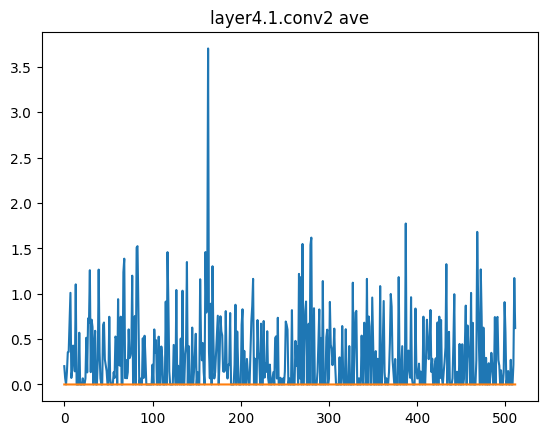

In [15]:
# フィルターごとの重み合計や平均を見る
for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d):
        # 重みテンソルを取得 (out_channels, in_channels, h, w)
        weight = module.weight.detach()
        
        # フィルター（out_channels次元）ごとに、絶対値の合計を計算
        # dim=(1,2,3) は in_channels, height, width の次元を潰すという意味
        filter_sum = torch.sum(torch.abs(weight), dim=(1, 2, 3))
        filter_ave = filter_sum / (weight.size()[1]*weight.size()[2]*weight.size()[3])

        plt.plot(filter_sum)
        #plt.ylim(-0.1, 0.2)
        plt.title(name+" sum")
        #plt.show()
        plt.plot(filter_ave)
        plt.title(name+" ave")
        #plt.ylim(-0, 0.01)
        plt.show()

In [16]:
import torch_pruning as tp
#print(tp.__version__)
#print(tp.__file__)

# 準備ができたモデルをGPU/CPUに送る
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


####### ADMM後のモデルを用いて枝刈りターゲットを特定

# 枝刈りしたいモジュール名と、その中で削除するチャネルのインデックスを保存する辞書
pruning_targets_by_name = {}

for name, module in model.named_modules():
    if isinstance(module, nn.Conv2d):
        # 重みテンソルを取得 (out_channels, in_channels, h, w)
        weight = module.weight.detach()
        
        # フィルター（out_channels次元）ごとに、絶対値の合計を計算
        # dim=(1,2,3) は in_channels, height, width の次元を潰すという意味
        filter_sum = torch.sum(torch.abs(weight), dim=(1, 2, 3))
        filter_ave = filter_sum / (weight.size()[1]*weight.size()[2]*weight.size()[3])
        
        # 合計が0のフィルター（＝全ての重みが0のフィルター）のインデックスを見つける
        indices_to_prune = torch.where(filter_sum == 0)[0].tolist()  # (filter_sum <= 0.5) & (filter_ave<=0.005)
        
        # 刈るべきフィルターが1つでもあれば、辞書に記録
        if indices_to_prune:
            pruning_targets_by_name[name] = indices_to_prune
            print(f"レイヤー '{name}': {len(indices_to_prune)}個のフィルターを枝刈り対象として特定。")

#######


レイヤー 'conv1': 9個のフィルターを枝刈り対象として特定。
レイヤー 'layer2.0.downsample.0': 3個のフィルターを枝刈り対象として特定。
レイヤー 'layer3.0.downsample.0': 12個のフィルターを枝刈り対象として特定。
レイヤー 'layer3.1.conv2': 24個のフィルターを枝刈り対象として特定。
レイヤー 'layer4.0.conv1': 2個のフィルターを枝刈り対象として特定。
レイヤー 'layer4.0.conv2': 16個のフィルターを枝刈り対象として特定。
レイヤー 'layer4.0.downsample.0': 16個のフィルターを枝刈り対象として特定。
レイヤー 'layer4.1.conv1': 24個のフィルターを枝刈り対象として特定。
レイヤー 'layer4.1.conv2': 197個のフィルターを枝刈り対象として特定。


In [17]:
####### 密モデルに対して枝刈り計画を作成し、実行

# 密モデルの重みに対してマスクをかける
pt_model_path = "../dense.pt"
model = models.resnet18()
model.fc = nn.Linear(model.fc.in_features, 10)  # CIFAR-10 にあわせて出力層変更
model.load_state_dict(torch.load(pt_model_path))
model.to(device)

# 依存関係グラフを構築するためのダミー入力
# 値はランダムでOK。形状が正しいことが重要。
example_inputs = torch.randn(1, 3, 224, 224).to(device)

# ★★★ ここからが、より堅牢なワークフロー ★★★

# 1. 依存関係グラフを構築 (これは変更なし)
DG = tp.DependencyGraph()
DG.build_dependency(model, example_inputs=example_inputs)

# 2. 枝刈りグループのリストを作成する
pruning_groups = []
for name, indices in pruning_targets_by_name.items():
    # ターゲットのモジュールを取得
    module_to_prune = model.get_submodule(name)
    
    # 3. DG.get_pruning_groupを使って、依存関係を明示的に解決させる
    #    このグループには、conv1だけでなく、bn1なども自動的に含まれる
    group = DG.get_pruning_group(
        module=module_to_prune, 
        pruning_fn=tp.function.prune_conv_out_channels,  
        idxs=indices
    )
    pruning_groups.append(group)
    print(f"レイヤー '{name}' の枝刈りグループを作成: {group}")

# 4. グループを一つずつ実行する
for group in pruning_groups:
    # 念のため、グループが有効かチェック
    if DG.check_pruning_group(group):
        group.prune()


レイヤー 'conv1' の枝刈りグループを作成: 
--------------------------------
          Pruning Group
--------------------------------
[0] prune_out_channels on conv1 (Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)) => prune_out_channels on conv1 (Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)), len(idxs)=9
[1] prune_out_channels on conv1 (Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)) => prune_out_channels on bn1 (BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)), len(idxs)=9
[2] prune_out_channels on bn1 (BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)) => prune_out_channels on _ElementWiseOp_20(ReluBackward0), len(idxs)=9
[3] prune_out_channels on _ElementWiseOp_20(ReluBackward0) => prune_out_channels on _ElementWiseOp_19(MaxPool2DWithIndicesBackward0), len(idxs)=9
[4] prune_out_channels on _ElementWiseOp_19(MaxPool2DWithIndicesBackward0) => prune_o

In [18]:
# 構造的かつ非構造枝刈りしたときのゼロ比率を表示
all_conv_params = 0
all_conv_zeros = 0

for name, module in model.named_modules():
  if isinstance(module, torch.nn.Conv2d):
    print(f"{name} Zero-Ratio: {100.0 * float(torch.sum(module.weight == 0)) / float(module.weight.nelement()):.4f}%")
    weight_after_pruning = module.weight
    num_zeros = (weight_after_pruning == 0).sum().item()
    total_params = weight_after_pruning.numel()
    all_conv_params += total_params
    all_conv_zeros += num_zeros

sparsity = 100. * all_conv_zeros / all_conv_params if all_conv_params > 0 else 0
print(f"全畳み込み層の0率：{sparsity:.4f}%")

print(model)

conv1 Zero-Ratio: 0.0000%
layer1.0.conv1 Zero-Ratio: 0.0000%
layer1.0.conv2 Zero-Ratio: 0.0000%
layer1.1.conv1 Zero-Ratio: 0.0000%
layer1.1.conv2 Zero-Ratio: 0.0000%
layer2.0.conv1 Zero-Ratio: 0.0000%
layer2.0.conv2 Zero-Ratio: 0.0000%
layer2.0.downsample.0 Zero-Ratio: 0.0000%
layer2.1.conv1 Zero-Ratio: 0.0000%
layer2.1.conv2 Zero-Ratio: 0.0000%
layer3.0.conv1 Zero-Ratio: 0.0000%
layer3.0.conv2 Zero-Ratio: 0.0000%
layer3.0.downsample.0 Zero-Ratio: 0.0000%
layer3.1.conv1 Zero-Ratio: 0.0000%
layer3.1.conv2 Zero-Ratio: 0.0000%
layer4.0.conv1 Zero-Ratio: 0.0000%
layer4.0.conv2 Zero-Ratio: 0.0000%
layer4.0.downsample.0 Zero-Ratio: 0.0000%
layer4.1.conv1 Zero-Ratio: 0.0000%
layer4.1.conv2 Zero-Ratio: 0.0000%
全畳み込み層の0率：0.0000%
ResNet(
  (conv1): Conv2d(3, 55, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(55, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=

In [19]:
# 再訓練
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = 0.001)   #lr = 0.001で損失0.02とか
num_epochs = 30 #15
epoch_loss_list = []
# CosineAnnealingLRを定義
# T_max: 学習率が半周期で最小値になるまでのエポック数。通常、総エポック数を指定。
# eta_min: 最小学習率。
scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

for epoch in range(num_epochs):
  model.train()
  model = model.to(device)
  total_loss = 0.0
  num_train = 0
  for inputs, labels in trainloader:
    inputs, labels = inputs.to(device), labels.to(device)   # データ代入

    # 重み更新のための手順
    optimizer.zero_grad()
    outputs = model(inputs)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()

    # 損失を記録
    total_loss += loss.item()*labels.size(0)
    num_train+=labels.size(0)

  # 出力と記録
  epoch_loss_list.append(total_loss/num_train)
  current_lr = optimizer.param_groups[0]['lr']
  print(f'Epoch[{epoch+1}/{num_epochs}], Loss: {epoch_loss_list[epoch]:.4f}, LR: {current_lr:.8f}')


  # 次のエポックへの準備
  if epoch >= 1:
    if np.abs(epoch_loss_list[epoch]-epoch_loss_list[epoch-1]) < 0.001:
      print('early stop')
      break
  scheduler.step()

Epoch[1/30], Loss: 0.3136, LR: 0.00100000


Epoch[2/30], Loss: 0.1527, LR: 0.00099726


Epoch[3/30], Loss: 0.0950, LR: 0.00098907


Epoch[4/30], Loss: 0.0634, LR: 0.00097553


Epoch[5/30], Loss: 0.0608, LR: 0.00095677


Epoch[6/30], Loss: 0.0357, LR: 0.00093301


Epoch[7/30], Loss: 0.0225, LR: 0.00090451


Epoch[8/30], Loss: 0.0216, LR: 0.00087157
early stop


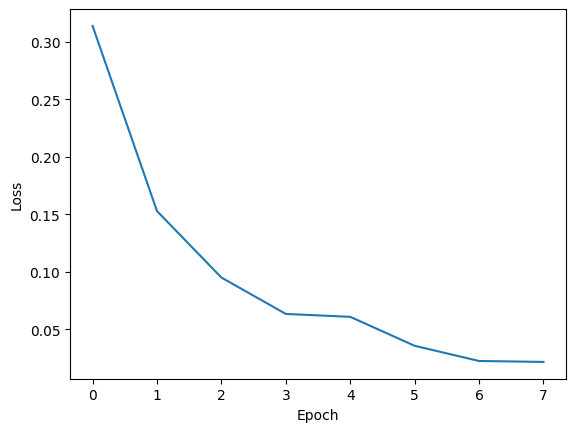

In [20]:
# 損失グラフ作成
plt.plot(epoch_loss_list)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

In [21]:
# onnxファイルとptファイルの作成
model = model.to('cpu')
model_to_onnx(model, "ADMM_onlyKernelFused.onnx")
#torch.save(model.state_dict(), "ADMM_onlyKernelFused.pt")

'ADMM_onlyKernelFused.onnx'

In [22]:
# 評価関数 (正解率を返すように変更)
def accuracy_test(model, test_loader, device):
    model.eval()
    model = model.to(device)
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    print(f'正解率: {accuracy:.2f}%')
    return accuracy

from deepsparse.benchmark.benchmark_model import benchmark_model
# 推論速度ベンチマーク (速度を返すように変更)
def run_benchmark(model_path, batch_size):
    result = benchmark_model(model_path, batch_size=batch_size)
    stats = result["benchmark_result"]
    median_time = stats["median"]
    print(f"推論レイテンシ中央値: {median_time:.2f} ms")
    return median_time

/home/rkaneko/.conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2025-11-19 19:24:57.330032189 [W:onnxruntime:Default, device_discovery.cc:164 DiscoverDevicesForPlatform] GPU device discovery failed: device_discovery.cc:89 ReadFileContents Failed to open file: "/sys/class/drm/card0/device/vendor"


In [23]:
import time

testset = torchvision.datasets.CIFAR10(root="./data", train=False, download=True, transform=transform)
testloader = DataLoader(testset, batch_size=400, shuffle=False)

start_time = time.time()
accuracy_test(model, testloader, device)
print(f"testloaderをバッチサイズ400で分けた時のGPUによる全推論が終わるまでの時間：{time.time()-start_time}.4f sec")
run_benchmark("ADMM_onlyKernelFused.onnx", batch_size=400)

2025-11-19 19:31:01 deepsparse.benchmark.helpers INFO     Thread pinning to cores enabled


正解率: 92.48%
testloaderをバッチサイズ400で分けた時のGPUによる全推論が終わるまでの時間：363.54162764549255.4f sec


DeepSparse, Copyright 2021-present / Neuralmagic, Inc. version: 1.8.0 COMMUNITY | (e3778e93) (release) (optimized) (system=avx512, binary=avx512)


2025-11-19 19:31:03 deepsparse.benchmark.benchmark_model INFO     deepsparse.engine.Engine:
	onnx_file_path: ADMM_onlyKernelFused.onnx
	batch_size: 400
	num_cores: 4
	num_streams: 1
	scheduler: Scheduler.default
	fraction_of_supported_ops: 1.0
	cpu_avx_type: avx512
	cpu_vnni: False


2025-11-19 19:31:03 deepsparse.utils.onnx INFO     Generating input 'input', type = float32, shape = [400, 3, 224, 224]


2025-11-19 19:31:03 deepsparse.benchmark.benchmark_model INFO     Starting 'singlestream' performance measurements for 10 seconds


推論レイテンシ中央値: 2710.99 ms


2710.9879232011735

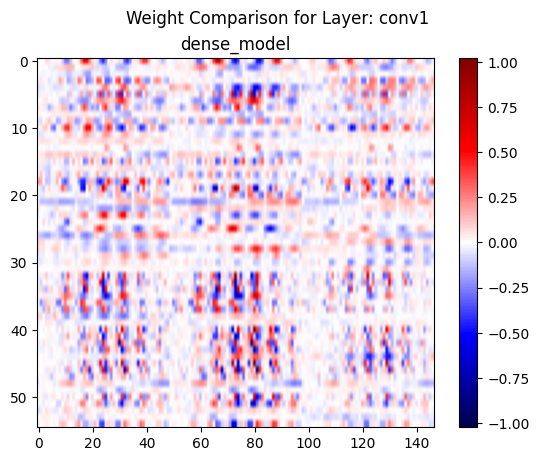

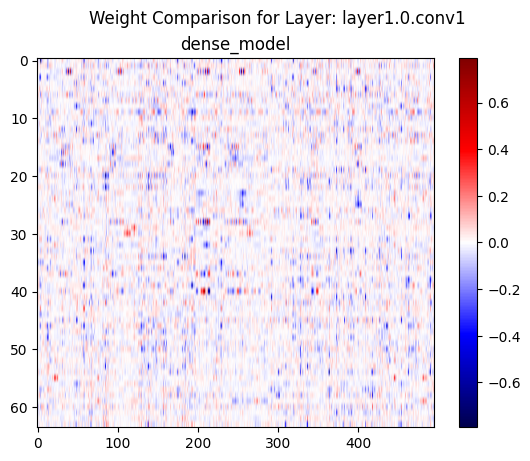

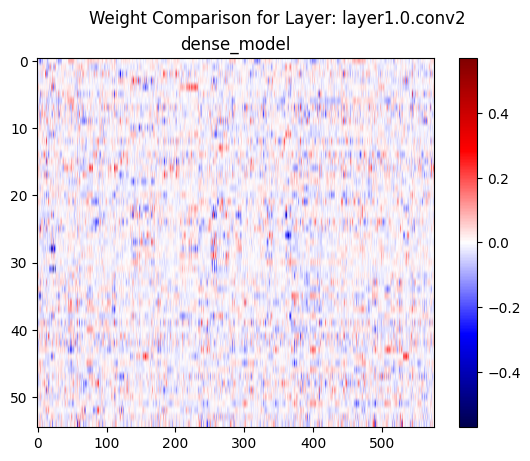

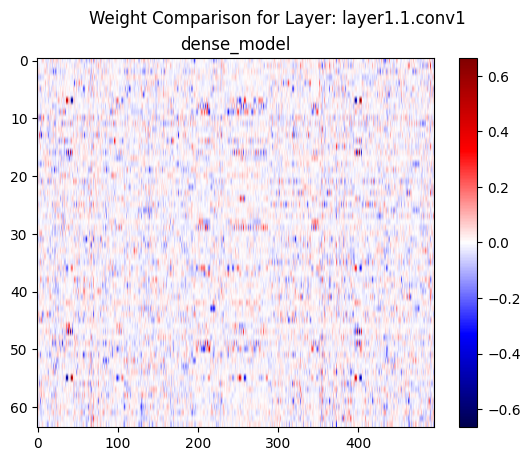

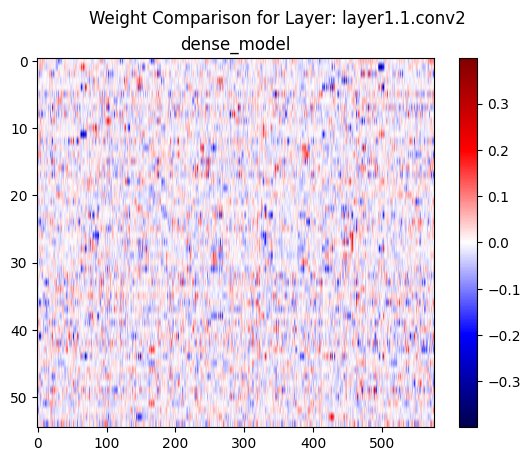

...

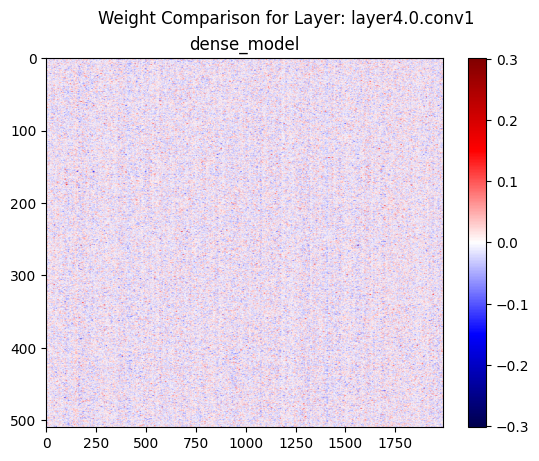

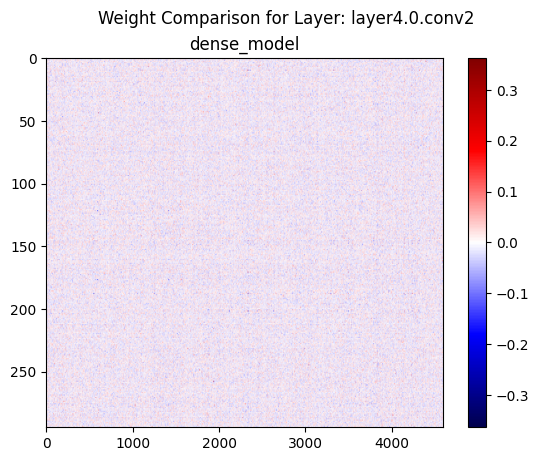

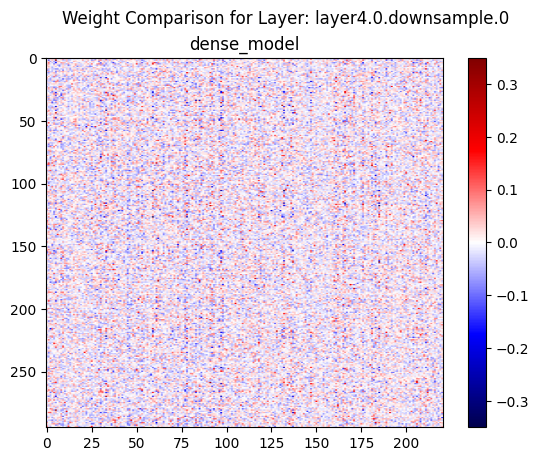

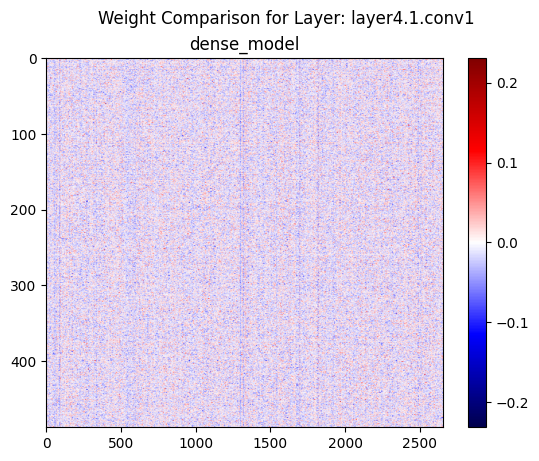

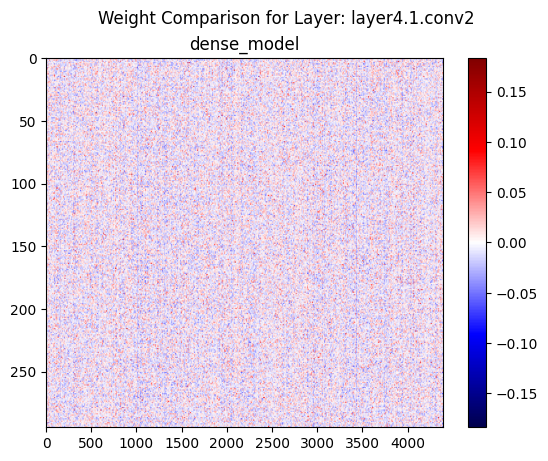

In [24]:
# 1. zipを使って2つのモデルのモジュールを同時にループ
model.to('cpu')
for (name1, module1) in model.named_modules():

    # 2. 両方のモジュールが畳み込み層(nn.Conv2d)か判定
    if isinstance(module1, nn.Conv2d):
        
        # グラフを2つ横に並べて表示する準備
        fig, axes = plt.subplots() # (1行, 2列)
        
        # --- 左側のグラフ (model1) ---
        w1_2d = module1.weight.data.view(module1.weight.size(0), -1).cpu().numpy()   #[:64, :147]      
        
        # 3. カラーマップの範囲を両モデルで揃える（重要！）
        # これにより、色の濃淡を公平に比較できる
        vmax = np.abs(w1_2d).max()
        
        # model1の重みをプロット
        im1 = axes.imshow(w1_2d, cmap='seismic', aspect='auto', vmin=-vmax, vmax=vmax)
        axes.set_title("dense_model")

        # カラーバーを追加
        fig.colorbar(im1, ax=axes)
        
        # グラフ全体にタイトルを付ける
        fig.suptitle(f'Weight Comparison for Layer: {name1}')
        
        plt.show()